In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal
import mne


In [2]:
import sys
sys.path.append('/Users/hamzaabdelhedi/Projects/enhancing_plt_utils/')
from enhancing_plt_utils import plt_enhancing
from color_maps import continuous_color_map, autumn, one_piece, oppenheimer, the_blues, green_bull, pink_ocean, pink_floyd, grey, spring
import matplotlib.style as style 
style.use('seaborn-poster') #sets the size of the charts

In [3]:
style.use('fivethirtyeight')

In [4]:
from src.rsa import RSA

In [5]:
path = "/Users/hamzaabdelhedi/Projects/data/MFRS_data/"
rdms_folder = os.path.join(path, "networks_rdms")
plots_folder = os.path.join(path, "plots")
subjects_dir = os.path.join(path, "subjects")
similarity_folder = os.path.join(path, "similarity_scores")

rois = mne.read_labels_from_annot(parc='aparc_sub', subject='fsaverage', subjects_dir=subjects_dir)
slicing_indices_meg = {
    "fam": (slice(None), slice(None), slice(130), slice(130)),
    "unfamiliar": (slice(None), slice(None), slice(130, 280), slice(130, 280)),
    "scrambled": (slice(None), slice(None), slice(280, None), slice(280, None))
}

slicing_indices_model = {
    "fam": (slice(None), slice(130), slice(130)),
    "unfamiliar": (slice(None), slice(130, 280), slice(130, 280)),
    "scrambled": (slice(None), slice(280, None), slice(280, None))
}


Reading labels from parcellation...
   read 226 labels from /Users/hamzaabdelhedi/Projects/data/MFRS_data/subjects/fsaverage/label/lh.aparc_sub.annot
   read 224 labels from /Users/hamzaabdelhedi/Projects/data/MFRS_data/subjects/fsaverage/label/rh.aparc_sub.annot


In [6]:
plt_enhancing(font_size=30, line_width=3, marker_size=10, marker_edge_width=2.5, line_width_global=2.5, patch_line_width=2.5, xtick_major_size=5.0, ytick_major_size=5.0, xtick_major_width=1.0, ytick_major_width=1.0, xtick_label_size="xx-large", ytick_label_size="xx-large", label_size="x-large", title_size="x-large", figure_title_size="xx-large", legend_size="large", figure_title_weight="bold", cap_size=4, dashed_pattern=[8.0, 4.0], savefig_format="svg", savefig_bbox="tight", spines_right=False, spines_top=False, auto_layout=True)

In [8]:
# Working with time segment of 500 ms starting from 100ms to 500ms
time_segment = 550
sampling_diff = 50
window_size = 25


In [9]:
models = [ "FaceNet", "SphereFace", "resnet50", "cornet_s", "vgg16_bn", "mobilenet", "inception_v3"]
model_names = ["FaceNet", "SphereFace", "ResNet50", "CORnet-S","VGG16", "MobileNet", "Inception"]

In [10]:
ann_analysis_types = [ "with-meg_pretrained", "None", "meg_stimuli_faces", "None"]
activations = ["trained","imagenet", "imagenet", "untrained"]


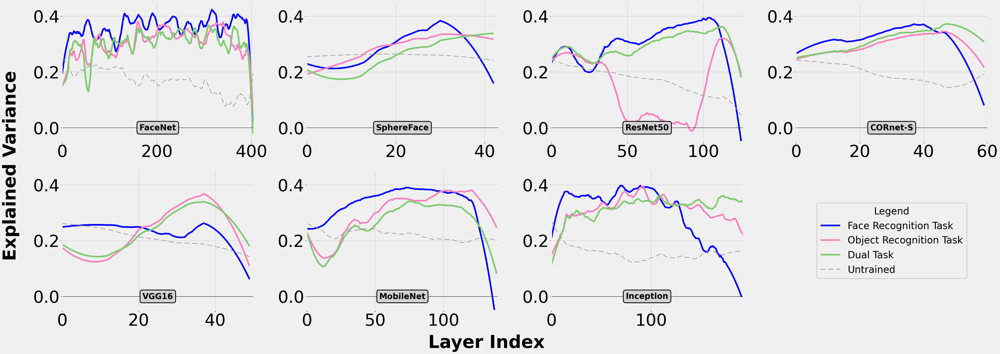

In [196]:
labels = [ "Face Recognition Task", "Object Recognition Task", "Dual Task", "Untrained"]
colors = [ spring[1], pink_ocean[-6], green_bull[4], grey[2], ]
fig, axs = plt.subplots(2, 4, figsize=(50, 15))
axs = axs.flatten()
noise_ceiling = np.load(os.path.join(similarity_folder, f"meg_fam_upper_noise_ceiling_{time_segment}_50.npy"))

for idx, (model, ax) in enumerate(zip(models, axs)):
    data_file = os.path.join(similarity_folder, f"avg_{model}_with-meg_pretrained_meg_rdm_trained_fam_{time_segment}_50.npy")
    data = np.load(data_file)
    data[data[:, :, :, 1] > 0.05] = 0
    # Get the region that gave the max value for with-meg_pretrained_meg_rdm_trained
    max_value = np.max(data[:, 2, :, 0], axis=1)
    max_value_idx = np.argmax(max_value)
    # Get the noise ceiling for this region
    noise_ceiling_region = noise_ceiling[max_value_idx]
    # Get region name
    region_name = rois[max_value_idx].name
    for ann_analysis_type, activation_type, color, label in zip(ann_analysis_types, activations, colors, labels):
        data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_fam_{time_segment}_50.npy")
        data = np.load(data_file)
        data[data[:, :, :, 1] > 0.05] = 0
        values = data[max_value_idx, 2, :, 0]
        smoothed_values = scipy.signal.savgol_filter(values, window_size, 2)
        smoothed_values = smoothed_values / noise_ceiling_region
        if activation_type == "untrained":
            ax.plot(np.arange(0, len(values)), smoothed_values, label=label, color=color, linestyle="--", linewidth=2)
        else:
            ax.plot(np.arange(0, len(values)), smoothed_values, label=label, color=color, linestyle="-", linewidth=5)
    ax.set_ylim(-0.05, 0.45)
    ax.set_xlim(0, len(values))
    bbox_props = dict(boxstyle="round, pad=0.3", edgecolor="black", facecolor="lightgrey")
    axs[idx].text(0.5, 0.1, f"{model_names[idx]}", fontsize=25, fontweight='bold', ha="center", va="center", transform=axs[idx].transAxes, bbox=bbox_props)
    ax.axhline(y = 0, color = 'black', linewidth = 1.3, alpha = .7)

handles, labels = axs[0].get_legend_handles_labels()
fig.text(-0.01, 0.5, 'Explained Variance', ha='center', va='center', rotation='vertical', fontweight='bold', fontsize=55)
fig.text(0.4, -0.01, 'Layer Index', ha='center', va='center', fontweight='bold', fontsize=55)
axs[7].add_artist(plt.legend(handles, labels, loc="center", title="Legend", fontsize=30, title_fontsize=30,))
axs[7].spines['right'].set_visible(False)
axs[7].spines['top'].set_visible(False)
axs[7].spines['left'].set_visible(False)
axs[7].spines['bottom'].set_visible(False)
axs[7].grid(False)
axs[7].tick_params(axis='both', which='both', length=0, labelbottom=False, labelleft=False)
plt.tight_layout(rect=[0, 0, 0.85, 1])  

plt.savefig(os.path.join(plots_folder, f'avg_models_with_meg_pretrained_fam_{time_segment}_50_{region_name}.svg'))
plt.show()

In [ ]:
rsa_instance = RSA(428)
data_file = os.path.join(similarity_folder, f"avg_{model}_with-meg_pretrained_meg_rdm_trained_fam_{time_segment}_50.npy")
data = np.load(data_file)
data[data[:, :, :, 1] > 0.05] = 0
max_value = np.max(data[:, 2, :, 0], axis=1)
max_value_idx = np.argmax(max_value)
brain_file = os.path.join(rdms_folder, "meg_avg_rdm_550_50.npy")
brain_rdm = np.load(brain_file)
brain_rdm = brain_rdm[max_value_idx, 2,:, :]
brain_rdm = np.expand_dims(np.expand_dims(brain_rdm, axis=0), axis=0)
brain_rdm = brain_rdm[slicing_indices_meg["fam"]]
for ann_analysis_type, activation_type in zip(ann_analysis_types, activations):
    if activation_type == "untrained":
        continue
    rsa_analysis = np.zeros((20, 404, 2))
    for seed in range(1,21):
        data_file = os.path.join(rdms_folder, model, f"{model}_{ann_analysis_type}_rdm_{activation_type}_{seed}.npy")
        model_rdm = np.load(data_file)
        model_rdm = model_rdm[slicing_indices_model["fam"]]
        rsa_score = rsa_instance.score(brain_rdm, model_rdm)
        rsa_analysis[seed-1, :, :] = rsa_score[0, 0, :, :]
    rsa_instance.save(rsa_analysis, os.path.join(similarity_folder, f"rsa_{model}_{ann_analysis_type}_{activation_type}_fam_{time_segment}_50_seeds.npy"))

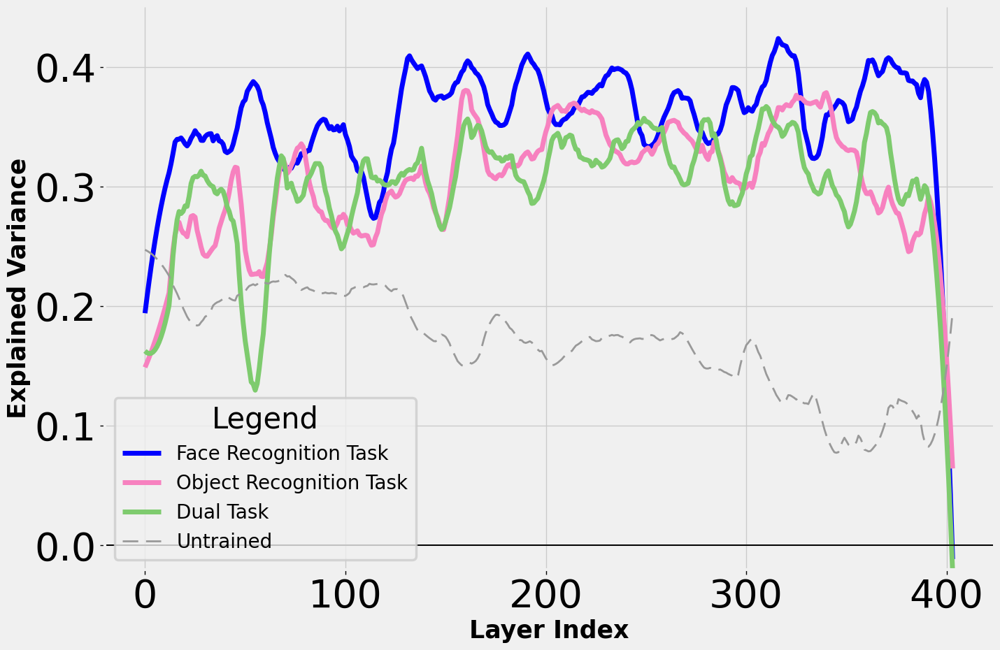

In [191]:

# Initialize the figure and subplots
fig, axs = plt.subplots(figsize=(15, 10))

for ann_analysis_type, activation_type, label, color in zip(ann_analysis_types, activations, labels, colors):
    data_file = os.path.join(similarity_folder, f"avg_FaceNet_{ann_analysis_type}_meg_rdm_{activation_type}_fam_{time_segment}_50.npy")
    data = np.load(data_file)
    data[data[:, :, :, 1] > 0.05] = 0
    values = data[max_value_idx, 2, :, 0]

    smoothed_values = scipy.signal.savgol_filter(values, window_size, 2)
    smoothed_values = smoothed_values / noise_ceiling_region
    if activation_type == "untrained":
        axs.plot(np.arange(0, len(values)), smoothed_values, label=label, color=color, linestyle="--", linewidth=2)
    else:
        axs.plot(np.arange(0, len(values)), smoothed_values, label=label, color=color, linewidth=5)
    axs.axhline(y = 0, color = 'black', linewidth = 1.3, alpha = .7)
axs.set_ylim(-0.02, 0.45)
axs.legend(loc='lower left', title="Legend", fontsize=20)
axs.set_xlabel("Layer Index", fontsize=25, fontweight='bold')
axs.set_ylabel("Explained Variance", fontsize=25, fontweight='bold')
axs.tick_params(axis='both', which='major', labelsize=40)
fig.tight_layout()
# Save the plot
plt.savefig(os.path.join(plots_folder, f'avg_FaceNet_with_meg_pretrained_fam_{time_segment}_50_{region_name}.svg'))
plt.show()


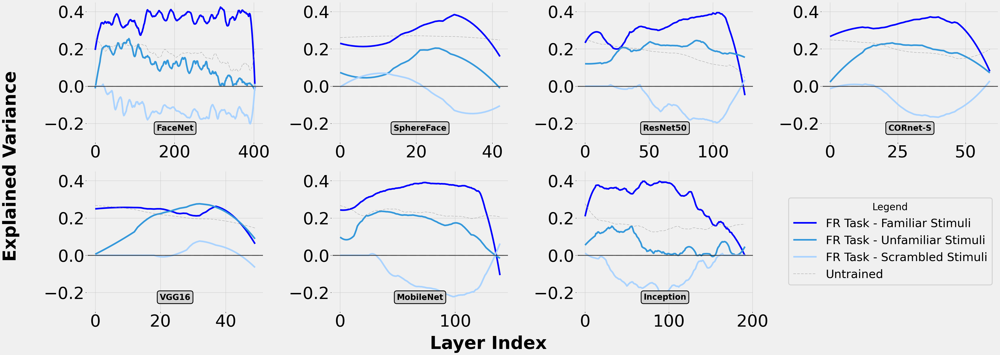

In [197]:
labels = [ "FR Task - Familiar Stimuli", "FR Task - Unfamiliar Stimuli", "FR Task - Scrambled Stimuli"]

colors = [ spring[1], the_blues[5], the_blues[8],  grey[2], ]
fig, axs = plt.subplots(2, 4, figsize=(50, 15))
axs = axs.flatten()
for idx, (model, ax) in enumerate(zip(models, axs)):
    data_file = os.path.join(similarity_folder, f"avg_{model}_with-meg_pretrained_meg_rdm_trained_fam_{time_segment}_50.npy")
    data = np.load(data_file)
    data[data[:, :, :, 1] > 0.05] = 0
    max_value = np.max(data[:, 2, :, 0], axis=1)
    max_value_idx = np.argmax(max_value)
    noise_ceiling_region = noise_ceiling[max_value_idx]
    for stimuli_index, stimuli_type in enumerate(["fam", "unfamiliar", "scrambled"]):
        noise_ceiling = np.load(os.path.join(similarity_folder, f"meg_{stimuli_type}_upper_noise_ceiling_{time_segment}_50.npy"))
        noise_ceiling_region = noise_ceiling[max_value_idx]
        data_file = os.path.join(similarity_folder, f"avg_{model}_with-meg_pretrained_meg_rdm_trained_{stimuli_type}_{time_segment}_50.npy")
        data = np.load(data_file)
        data[data[:, :, :, 1] > 0.05] = 0
        values = data[max_value_idx, 2, :, 0]
        smoothed_values = scipy.signal.savgol_filter(values, window_size, 2)
        smoothed_values = smoothed_values / noise_ceiling_region 
        ax.plot(np.arange(0, len(smoothed_values)), smoothed_values, label=f'{labels[stimuli_index]}', color=colors[stimuli_index], linewidth=5)
        ax.axhline(y=0, color='lightgray', linestyle='--', alpha=0.5)
    ax.set_ylim(-0.3, 0.45)
    bbox_props = dict(boxstyle="round, pad=0.3", edgecolor="black", facecolor="lightgrey")
    axs[idx].text(0.5, 0.1, model_names[idx], fontsize=25, fontweight='bold', ha="center", va="center", transform=axs[idx].transAxes, bbox=bbox_props)
    data_file = os.path.join(similarity_folder, f"avg_{model}_None_meg_rdm_untrained_fam_{time_segment}_50.npy")
    data = np.load(data_file)
    data[data[:, :, :, 1] > 0.05] = 0
    values = data[max_value_idx, 2, :, 0]
    smoothed_values = scipy.signal.savgol_filter(values, window_size, 2)
    smoothed_values = smoothed_values / noise_ceiling_region
    ax.plot(np.arange(0, len(smoothed_values)), smoothed_values, label=f'Untrained', color=grey[2], linestyle="--", linewidth=1)
    ax.axhline(y=0, color='black', linestyle='-', alpha=0.7)



handles, labels = axs[0].get_legend_handles_labels()
fig.text(-0.01, 0.5, 'Explained Variance', ha='center', va='center', rotation='vertical', fontweight='bold', fontsize=55)
fig.text(0.4, -0.01, 'Layer Index', ha='center', va='center', fontweight='bold', fontsize=55)
axs[7].add_artist(plt.legend(handles, labels, loc='right', title="Legend"))
axs[7].spines['right'].set_visible(False)
axs[7].spines['top'].set_visible(False)
axs[7].spines['left'].set_visible(False)
axs[7].spines['bottom'].set_visible(False)
axs[7].grid(False)
axs[7].tick_params(axis='both', which='both', length=0, labelbottom=False, labelleft=False)
plt.tight_layout(rect=[0, 0, 0.85, 1])  

# plt.savefig(os.path.join(plots_folder, f'influence_of_presenting_different_type_of_stimuli_all_models.png'), dpi=300)
plt.show()

In [107]:
rsa_instance = RSA(428)
data_file = os.path.join(similarity_folder, f"avg_{model}_with-meg_pretrained_meg_rdm_trained_fam_{time_segment}_50.npy")
data = np.load(data_file)
data[data[:, :, :, 1] > 0.05] = 0
max_value = np.max(data[:, 2, :, 0], axis=1)
max_value_idx = np.argmax(max_value)
brain_file = os.path.join(rdms_folder, "meg_avg_rdm_550_50.npy")
brain_rdm = np.load(brain_file)
brain_rdm = brain_rdm[max_value_idx, 2,:, :]
brain_rdm = np.expand_dims(np.expand_dims(brain_rdm, axis=0), axis=0)
for stimuli_type in ["fam", "unfamiliar", "scrambled"]:
    rsa_analysis = np.zeros((20, 404, 2))
    for seed in range(1,21):
        data_file = os.path.join(rdms_folder, model, f"{model}_{ann_analysis_type}_rdm_{activation_type}_{seed}.npy")
        model_rdm = np.load(data_file)
        rsa_score = rsa_instance.score(brain_rdm, model_rdm)
        print(rsa_score[0, 0, :, :].shape)
        rsa_analysis[seed-1, :, :] = rsa_score[0, 0, :, :]
        break
    break
    # rsa_instance.save(rsa_analysis, os.path.join(similarity_folder, f"rsa_{model}_{ann_analysis_type}_{activation_type}_fam_{time_segment}_50_seeds.npy"))

Computing RSA in parallel: 100%|██████████| 404/404 [00:00<00:00, 3479463.69it/s]

(404, 2)


[0.24240691]


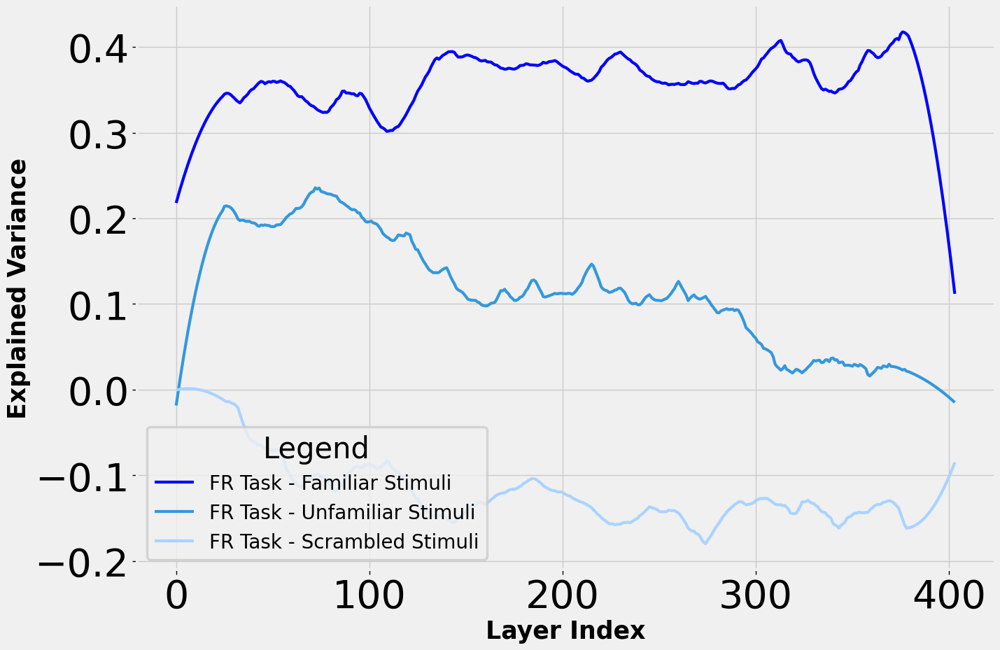

In [199]:

# Initialize the figure and subplots
fig, axs = plt.subplots(figsize=(15, 10))
error_bar_scale = 1e15
data_file = os.path.join(similarity_folder, f"avg_{model}_with-meg_pretrained_meg_rdm_trained_fam_{time_segment}_50.npy")
data = np.load(data_file)
data[data[:, :, :, 1] > 0.05] = 0
max_value = np.max(data[:, 2, :, 0], axis=1)
max_value_idx = np.argmax(max_value)
noise_ceiling = np.load(os.path.join(similarity_folder, f"meg_fam_upper_noise_ceiling_{time_segment}_50.npy"))
noise_ceiling_region = noise_ceiling[max_value_idx]
brain_file = os.path.join(rdms_folder, "meg_avg_rdm_550_50.npy")
brain_rdm = np.load(brain_file)
brain_rdm = brain_rdm[max_value_idx, 2,:, :]
error_bar_window_size = 15  # Adjust the window size for error bar smoothing

for label, stimuli_type, color, in zip(labels, ["fam", "unfamiliar", "scrambled"], colors):
    data_file = os.path.join(similarity_folder, f"avg_FaceNet_with-meg_pretrained_meg_rdm_trained_{stimuli_type}_{time_segment}_50.npy")
    data = np.load(data_file)
    data[data[:, :, :, 1] > 0.05] = 0
    values = data[max_value_idx, 2, :, 0]
    window_size = 50

    # Smoothing the main line
    smoothed_values = scipy.signal.savgol_filter(values, window_size, 2)
    smoothed_values = smoothed_values / noise_ceiling_region
    axs.plot(np.arange(0, len(values)), smoothed_values, label=label, color=color, linewidth=3)

axs.legend(loc='lower left', title="Legend", fontsize=20)
axs.set_xlabel("Layer Index", fontsize=25, fontweight='bold')
axs.set_ylabel("Explained Variance", fontsize=25, fontweight='bold')
axs.tick_params(axis='both', which='major', labelsize=40)

# # Save the plot
# # plt.savefig(os.path.join(plots_folder, f'influence_of_including_meg_stimuli_FaceNet.png'), dpi=300)
# plt.show()


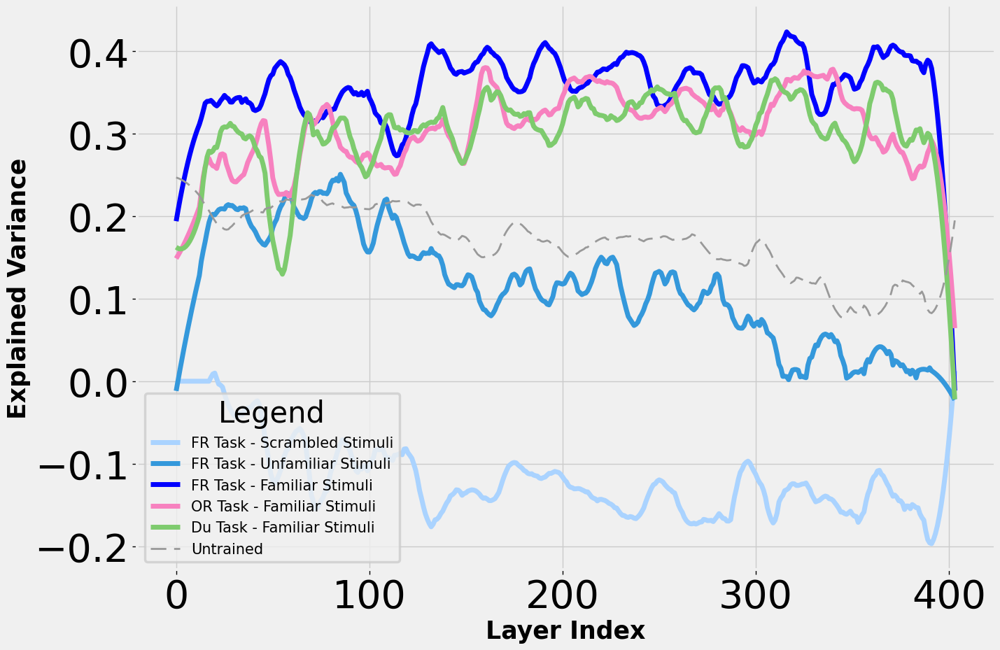

In [204]:

# Initialize the figure and subplots
fig, axs = plt.subplots(figsize=(15, 10))
error_bar_scale = 2e14
data_file = os.path.join(similarity_folder, f"avg_{model}_with-meg_pretrained_meg_rdm_trained_fam_{time_segment}_50.npy")
data = np.load(data_file)
data[data[:, :, :, 1] > 0.05] = 0
max_value = np.max(data[:, 2, :, 0], axis=1)
max_value_idx = np.argmax(max_value)
noise_ceiling = np.load(os.path.join(similarity_folder, f"meg_fam_upper_noise_ceiling_{time_segment}_50.npy"))
noise_ceiling_region = noise_ceiling[max_value_idx]
brain_file = os.path.join(rdms_folder, "meg_avg_rdm_550_50.npy")
brain_rdm = np.load(brain_file)
brain_rdm = brain_rdm[max_value_idx, 2,:, :]

labels = [ "FR Task - Scrambled Stimuli", "FR Task - Unfamiliar Stimuli",]
for label, stimuli_type, color, in zip(labels, ["scrambled", "unfamiliar"], [  the_blues[8], the_blues[5],]):
    data_file = os.path.join(similarity_folder, f"avg_FaceNet_with-meg_pretrained_meg_rdm_trained_{stimuli_type}_{time_segment}_50.npy")
    data = np.load(data_file)
    data[data[:, :, :, 1] > 0.05] = 0
    values = data[max_value_idx, 2, :, 0]
    window_size = 25
    smoothed_values = scipy.signal.savgol_filter(values, window_size, 2)
    smoothed_values = smoothed_values / noise_ceiling_region
    axs.plot(np.arange(0, len(values)), smoothed_values, label=label, color=color, linewidth=5)


colors = [ spring[1], pink_ocean[-6], green_bull[4], grey[2], ]
ann_analysis_types = [ "with-meg_pretrained", "None", "meg_stimuli_faces", "None",]
activations = [ "trained", "imagenet", "imagenet", "untrained",]
labels = [ "FR Task - Familiar Stimuli", "OR Task - Familiar Stimuli", "Du Task - Familiar Stimuli", "Untrained"]
for ann_analysis_type, activation_type, label, color in zip(ann_analysis_types, activations, labels, colors):
    data_file = os.path.join(similarity_folder, f"avg_FaceNet_{ann_analysis_type}_meg_rdm_{activation_type}_fam_{time_segment}_50.npy")
    data = np.load(data_file)
    data[data[:, :, :, 1] > 0.05] = 0
    values = data[max_value_idx, 2, :, 0]
    window_size = 25
    smoothed_values = scipy.signal.savgol_filter(values, window_size, 2)
    smoothed_values = smoothed_values / noise_ceiling_region
    if activation_type == "untrained":
        axs.plot(np.arange(0, len(values)), smoothed_values, label=label, color=color, linestyle="--", linewidth=2)
    else:
        axs.plot(np.arange(0, len(values)), smoothed_values, label=label, color=color, linewidth=5)


axs.legend(loc='lower left', title="Legend", fontsize=15)
axs.set_xlabel("Layer Index", fontsize=25, fontweight='bold')
axs.set_ylabel("Explained Variance", fontsize=25, fontweight='bold')
axs.tick_params(axis='both', which='major', labelsize=40)

# # Save the plot
# # plt.savefig(os.path.join(plots_folder, f'influence_of_including_meg_stimuli_FaceNet.png'), dpi=300)
# plt.show()


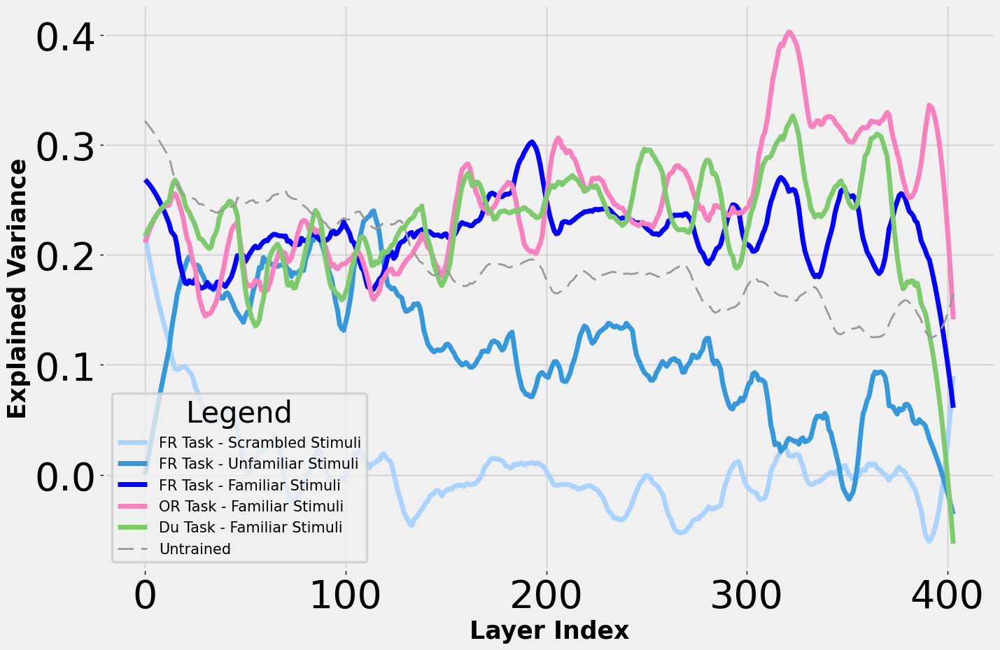

In [214]:

# Initialize the figure and subplots
fig, axs = plt.subplots(figsize=(15, 10))
max_value_idx = 117
noise_ceiling = np.load(os.path.join(similarity_folder, f"meg_fam_upper_noise_ceiling_{time_segment}_50.npy"))
noise_ceiling_region = noise_ceiling[max_value_idx]
brain_file = os.path.join(rdms_folder, "meg_avg_rdm_550_50.npy")
brain_rdm = np.load(brain_file)
brain_rdm = brain_rdm[max_value_idx, 2,:, :]

labels = [ "FR Task - Scrambled Stimuli", "FR Task - Unfamiliar Stimuli",]
for label, stimuli_type, color, in zip(labels, ["scrambled", "unfamiliar"], [  the_blues[8], the_blues[5],]):
    data_file = os.path.join(similarity_folder, f"avg_FaceNet_with-meg_pretrained_meg_rdm_trained_{stimuli_type}_{time_segment}_50.npy")
    data = np.load(data_file)
    # data[data[:, :, :, 1] > 0.05] = 0
    values = data[max_value_idx, 2, :, 0]
    window_size = 25
    smoothed_values = scipy.signal.savgol_filter(values, window_size, 2)
    smoothed_values = smoothed_values / noise_ceiling_region
    axs.plot(np.arange(0, len(values)), smoothed_values, label=label, color=color, linewidth=5)


colors = [ spring[1], pink_ocean[-6], green_bull[4], grey[2], ]
ann_analysis_types = [ "with-meg_pretrained", "None", "meg_stimuli_faces", "None",]
activations = [ "trained", "imagenet", "imagenet", "untrained",]
labels = [ "FR Task - Familiar Stimuli", "OR Task - Familiar Stimuli", "Du Task - Familiar Stimuli", "Untrained"]
for ann_analysis_type, activation_type, label, color in zip(ann_analysis_types, activations, labels, colors):
    data_file = os.path.join(similarity_folder, f"avg_FaceNet_{ann_analysis_type}_meg_rdm_{activation_type}_fam_{time_segment}_50.npy")
    data = np.load(data_file)
    # data[data[:, :, :, 1] > 0.05] = 0
    values = data[max_value_idx, 2, :, 0]
    window_size = 25
    smoothed_values = scipy.signal.savgol_filter(values, window_size, 2)
    smoothed_values = smoothed_values / noise_ceiling_region
    if activation_type == "untrained":
        axs.plot(np.arange(0, len(values)), smoothed_values, label=label, color=color, linestyle="--", linewidth=2)
    else:
        axs.plot(np.arange(0, len(values)), smoothed_values, label=label, color=color, linewidth=5)


axs.legend(loc='lower left', title="Legend", fontsize=15)
axs.set_xlabel("Layer Index", fontsize=25, fontweight='bold')
axs.set_ylabel("Explained Variance", fontsize=25, fontweight='bold')
axs.tick_params(axis='both', which='major', labelsize=40)

# # Save the plot
# # plt.savefig(os.path.join(plots_folder, f'influence_of_including_meg_stimuli_FaceNet.png'), dpi=300)
# plt.show()


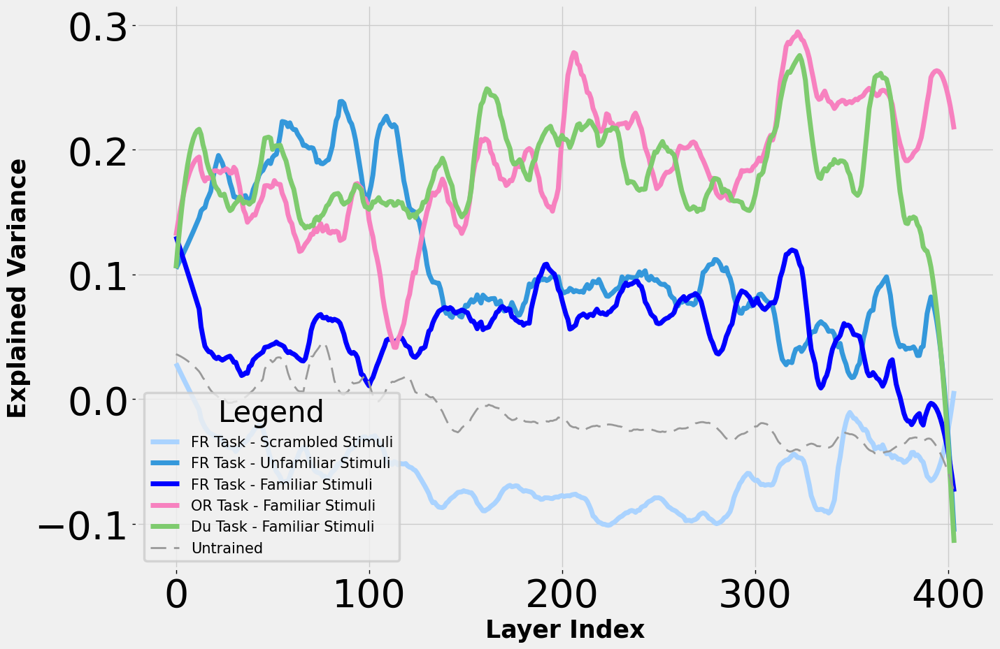

In [235]:

# Initialize the figure and subplots
fig, axs = plt.subplots(figsize=(15, 10))
max_value_idx = 34
noise_ceiling = np.load(os.path.join(similarity_folder, f"meg_fam_upper_noise_ceiling_{time_segment}_50.npy"))
noise_ceiling_region = noise_ceiling[max_value_idx]
brain_file = os.path.join(rdms_folder, "meg_avg_rdm_550_50.npy")
brain_rdm = np.load(brain_file)
brain_rdm = brain_rdm[max_value_idx, 2,:, :]

labels = [ "FR Task - Scrambled Stimuli", "FR Task - Unfamiliar Stimuli",]
for label, stimuli_type, color, in zip(labels, ["scrambled", "unfamiliar"], [  the_blues[8], the_blues[5],]):
    data_file = os.path.join(similarity_folder, f"avg_FaceNet_with-meg_pretrained_meg_rdm_trained_{stimuli_type}_{time_segment}_50.npy")
    data = np.load(data_file)
    # data[data[:, :, :, 1] > 0.05] = 0
    values = data[max_value_idx, 2, :, 0]
    window_size = 25
    smoothed_values = scipy.signal.savgol_filter(values, window_size, 2)
    smoothed_values = smoothed_values / noise_ceiling_region
    axs.plot(np.arange(0, len(values)), smoothed_values, label=label, color=color, linewidth=5)


colors = [ spring[1], pink_ocean[-6], green_bull[4], grey[2], ]
ann_analysis_types = [ "with-meg_pretrained", "None", "meg_stimuli_faces", "None",]
activations = [ "trained", "imagenet", "imagenet", "untrained",]
labels = [ "FR Task - Familiar Stimuli", "OR Task - Familiar Stimuli", "Du Task - Familiar Stimuli", "Untrained"]
for ann_analysis_type, activation_type, label, color in zip(ann_analysis_types, activations, labels, colors):
    data_file = os.path.join(similarity_folder, f"avg_FaceNet_{ann_analysis_type}_meg_rdm_{activation_type}_fam_{time_segment}_50.npy")
    data = np.load(data_file)
    # data[data[:, :, :, 1] > 0.05] = 0
    values = data[max_value_idx, 2, :, 0]
    window_size = 25
    smoothed_values = scipy.signal.savgol_filter(values, window_size, 2)
    smoothed_values = smoothed_values / noise_ceiling_region
    if activation_type == "untrained":
        axs.plot(np.arange(0, len(values)), smoothed_values, label=label, color=color, linestyle="--", linewidth=2)
    else:
        axs.plot(np.arange(0, len(values)), smoothed_values, label=label, color=color, linewidth=5)


axs.legend(loc='lower left', title="Legend", fontsize=15)
axs.set_xlabel("Layer Index", fontsize=25, fontweight='bold')
axs.set_ylabel("Explained Variance", fontsize=25, fontweight='bold')
axs.tick_params(axis='both', which='major', labelsize=40)

# # Save the plot
# # plt.savefig(os.path.join(plots_folder, f'influence_of_including_meg_stimuli_FaceNet.png'), dpi=300)
# plt.show()


In [ ]:
rsa_instance = RSA(428)
brain_file = os.path.join(rdms_folder, "meg_avg_rdm_550_50.npy")
brain_rdm = np.load(brain_file)

for model in ["FaceNet", "cornet_s"]:
    print(model)
    for ann_analysis_type, activation_type in zip(ann_analysis_types[1:], activations[1:]):
        if activation_type == "trained":
            for stimuli_type in ["fam", "unfamiliar", "scrambled"]:
                data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_{stimuli_type}_{time_segment}_50.npy")
                data = np.load(data_file)
                data[data[:, :, :, 1] > 0.05] = 0
                max_value_region = np.max(data[:, 2, :, 0], axis=1)
                max_value_region_idx = np.argmax(max_value_region)
                brain_rdm_region = brain_rdm[max_value_region_idx, 2,:, :]
                brain_rdm_region = np.expand_dims(np.expand_dims(brain_rdm_region, axis=0), axis=0)
                brain_rdm_region = brain_rdm_region[slicing_indices_meg[stimuli_type]]
                max_value_model = np.max(data[max_value_region_idx, 2, :, 0])
                max_value_model_idx = np.argmax(data[max_value_region_idx, 2, :, 0])
                rsa_analysis = np.zeros((20, 2))
                for seed in range(1, 21):
                    model_rdm = np.load(os.path.join(rdms_folder, model, f"{model}_{ann_analysis_type}_rdm_{activation_type}_{seed}.npy"))
                    model_rdm_layer = model_rdm[max_value_model_idx, :, :]
                    model_rdm_layer = np.expand_dims(model_rdm_layer, axis=0)
                    model_rdm_layer = model_rdm_layer[slicing_indices_model[stimuli_type]]
                    rsa_score = rsa_instance.score(brain_rdm_region, model_rdm_layer)
                    rsa_analysis[seed-1, :] = rsa_score[0, 0, :, :]
                rsa_instance.save(rsa_analysis, os.path.join(similarity_folder, f"rsa_{model}_{ann_analysis_type}_{activation_type}_{stimuli_type}_{time_segment}_50_seeds_layer_{max_value_model_idx}_brain_{max_value_region_idx}.npy"))
        else:
            data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_fam_{time_segment}_50.npy")
            data = np.load(data_file)
            data[data[:, :, :, 1] > 0.05] = 0
            max_value_region = np.max(data[:, 2, :, 0], axis=1)
            max_value_region_idx = np.argmax(max_value_region)
            brain_rdm_region = brain_rdm[max_value_region_idx, 2,:, :]
            brain_rdm_region = np.expand_dims(np.expand_dims(brain_rdm_region, axis=0), axis=0)
            brain_rdm_region = brain_rdm_region[slicing_indices_meg["fam"]]
            max_value_model = np.max(data[max_value_region_idx, 2, :, 0])
            max_value_model_idx = np.argmax(data[max_value_region_idx, 2, :, 0])
            rsa_analysis = np.zeros((20, 2))
            for seed in range(1, 21):
                try:
                    model_rdm = np.load(os.path.join(rdms_folder, model, f"{model}_{ann_analysis_type}_rdm_{activation_type}_{seed}.npy"))
                except:
                    Warning(f"Model {model} with {ann_analysis_type} and {activation_type} not found")
                model_rdm_layer = model_rdm[max_value_model_idx, :, :]
                model_rdm_layer = np.expand_dims(model_rdm_layer, axis=0)
                model_rdm_layer = model_rdm_layer[slicing_indices_model["fam"]]
                rsa_score = rsa_instance.score(brain_rdm_region, model_rdm_layer)
                rsa_analysis[seed-1, :] = rsa_score[0, 0, :, :]
            rsa_instance.save(rsa_analysis, os.path.join(similarity_folder, f"rsa_{model}_{ann_analysis_type}_{activation_type}_fam_{time_segment}_50_seeds_layer_{max_value_model_idx}_brain_{max_value_region_idx}.npy"))

In [61]:
import glob
import os


In [ ]:
error_bars = [[], []]
for idx, model in enumerate(["FaceNet", "cornet_s"]):
    for ann_analysis_type, activation_type in zip(ann_analysis_types[1:], activations[1:]):
        print(ann_analysis_type)
        if activation_type == "trained":
            for stimuli_type in ["fam", "unfamiliar", "scrambled"]:
                pattern = os.path.join(similarity_folder, f"rsa_{model}_{ann_analysis_type}_{activation_type}_{stimuli_type}_{time_segment}_50_seeds_layer_*_brain_*.npy")
                seeds_files = glob.glob(pattern)
                data = np.load(seeds_files[0])
                if model == "cornet_s" and stimuli_type == "fam":
                    print(data)                   

                std = np.std(data[:, 0], axis=0)
                sem_corr = np.std(data[:, 0], axis=0) / np.sqrt(rsa_analysis.shape[0])
                error_bars[idx].append(sem_corr)
        else:
            pattern = os.path.join(similarity_folder, f"rsa_{model}_{ann_analysis_type}_{activation_type}_fam_{time_segment}_50_seeds_layer_*_brain_*.npy")
            seeds_files = glob.glob(pattern)
            data = np.load(seeds_files[0])
            std = np.std(data[:, 0], axis=0)
            sem_corr = np.std(data[:, 0], axis=0) / np.sqrt(rsa_analysis.shape[0])
            error_bars[idx].append(sem_corr)
                
error_bars[0].append(0)
error_bars[1].append(0)
# error_bars[1][1] = error_bars[1][1]* 1e-15
error_bars = np.array(error_bars)/noise_ceiling_region
# error_bars = error_bars * 1e15

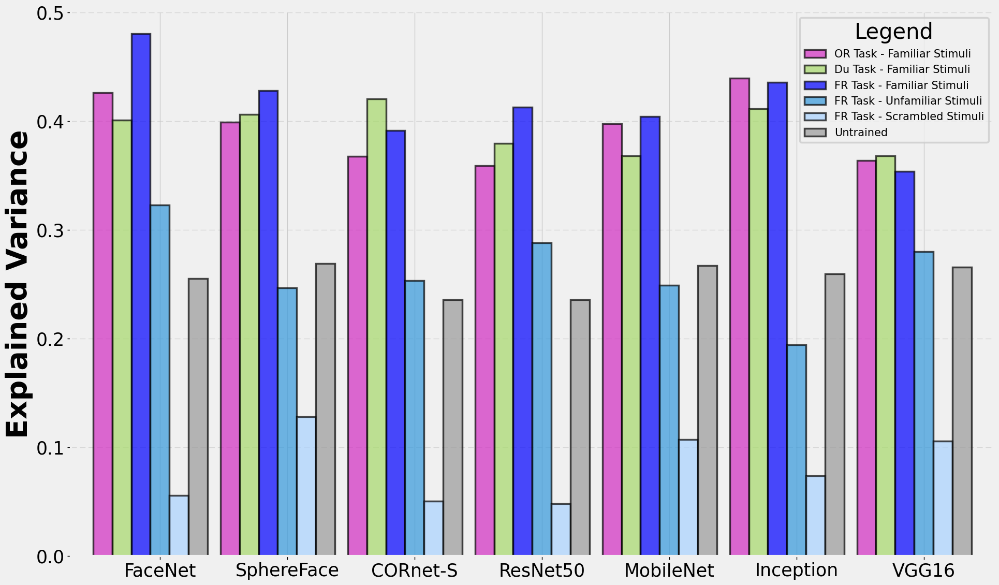

In [273]:
models = [ "FaceNet", "SphereFace", "cornet_s",  "resnet50", "mobilenet", "inception_v3", "vgg16_bn",]
model_names = [  "FaceNet", "SphereFace", "CORnet-S",  "ResNet50", "MobileNet", "Inception", "VGG16",]
labels = [ 
        "OR Task - Familiar Stimuli", 
        "Du Task - Familiar Stimuli",
        "FR Task - Familiar Stimuli", 
        "FR Task - Unfamiliar Stimuli", 
        "FR Task - Scrambled Stimuli", 
        "Untrained",]

ann_analysis_types = [   "None", "meg_stimuli_faces", "with-meg_pretrained", "None",]
activations = [  "imagenet", "imagenet", "trained", "untrained",]
colors = [ pink_ocean[-2], pink_ocean[-5], pink_ocean[1],   pink_ocean[4], pink_ocean[7], one_piece[3],]
colors = [ pink_ocean[-4], green_bull[5],  spring[1], the_blues[5], the_blues[8],  grey[2], ]

fig, ax = plt.subplots(figsize=(20, 12))
time_segment_sim_values = [[] for _ in range(7)]
for model_idx, model in enumerate(models):
    data_file = os.path.join(similarity_folder, f"avg_{model}_with-meg_pretrained_meg_rdm_trained_fam_550_50.npy")
    noise_ceiling = np.load(os.path.join(similarity_folder, f"meg_fam_upper_noise_ceiling_{time_segment}_50.npy"))
    data = np.load(data_file)
    data[data[:, :, :, 1] > 0.05] = 0
    max_value = np.max(data[:, 2, :, 0], axis=1)
    max_value_idx = np.argmax(max_value)
    noise_ceiling_region = noise_ceiling[max_value_idx]
    for ann_analysis_type, activation_type in zip(ann_analysis_types, activations):
        if ann_analysis_type != "with-meg_pretrained":
            data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_fam_{time_segment}_50.npy")
            data = np.load(data_file)
            # data[data[:, :, :, 1] > 0.05] = 0
            max_value = np.max(data[max_value_idx, 2, 4:, 0])   
            noise_ceiling = np.load(os.path.join(similarity_folder, f"meg_fam_upper_noise_ceiling_{time_segment}_50.npy"))
            noise_ceiling_region = noise_ceiling[max_value_idx]        
            value = max_value/noise_ceiling_region
            time_segment_sim_values[model_idx].append(value[0])
        else:
            for stimuli_type in [  "fam","unfamiliar", "scrambled"]:
                data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_{stimuli_type}_{time_segment}_50.npy")
                data = np.load(data_file)
                # data[data[:, :, :, 1] > 0.05] = 0
                max_value = np.max(data[max_value_idx, 2, 4:, 0])
                noise_ceiling = np.load(os.path.join(similarity_folder, f"meg_{stimuli_type}_upper_noise_ceiling_{time_segment}_50.npy"))
                noise_ceiling_region = noise_ceiling[max_value_idx]
                value = max_value/noise_ceiling_region
                time_segment_sim_values[model_idx].append(value[0])

bar_width = 0.9/len(time_segment_sim_values[0]) # Width of each bar


time_segment_sim_values_rearranged = np.array(time_segment_sim_values).T
for n_experiments in range(len(time_segment_sim_values[0])):
    list_values = [model_sim_values[n_experiments] for model_sim_values in time_segment_sim_values]
    ax.bar(np.arange(len(models))+bar_width*n_experiments, list_values, width=bar_width, alpha=0.7, edgecolor='black',
    color=colors[n_experiments], label=labels[n_experiments])
    ax.set_ylabel("Explained Variance", fontsize=40, fontweight='bold')
    ax.legend(loc='upper right', title="Legend", fontsize=15)

x_ticks = [ bar_width*(len(time_segment_sim_values[0])//2) + idx_model for idx_model in np.arange(len(models)) ]
ax.set_xticks(x_ticks)
ax.set_xticklabels(model_names)
ax.tick_params(axis='both', which='major', labelsize=25)
ax.set_ylim(0., 0.5)
ax.set_xlim(-0.25, 7)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()  

# # Save the plot
# plt.savefig(os.path.join(plots_folder, f'Max_similarity_values_different_experiments.png'), dpi=300, bbox_inches='tight')
plt.show()

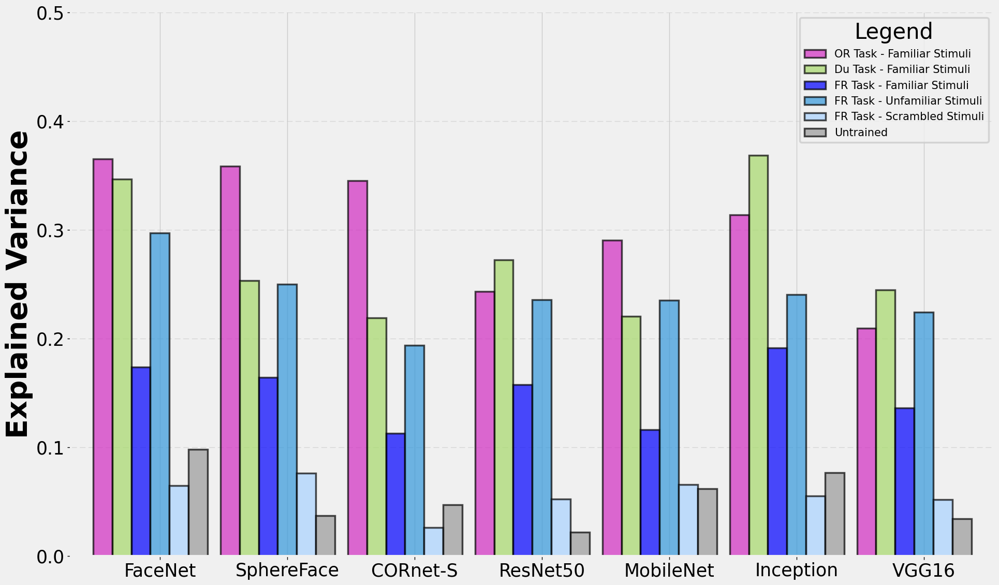

In [301]:
models = [ "FaceNet", "SphereFace", "cornet_s",  "resnet50", "mobilenet", "inception_v3", "vgg16_bn",]
model_names = [  "FaceNet", "SphereFace", "CORnet-S",  "ResNet50", "MobileNet", "Inception", "VGG16",]
labels = [ 
        "OR Task - Familiar Stimuli", 
        "Du Task - Familiar Stimuli",
        "FR Task - Familiar Stimuli", 
        "FR Task - Unfamiliar Stimuli", 
        "FR Task - Scrambled Stimuli", 
        "Untrained",]

ann_analysis_types = [   "None", "meg_stimuli_faces", "with-meg_pretrained", "None",]
activations = [  "imagenet", "imagenet", "trained", "untrained",]
colors = [ pink_ocean[-4], green_bull[5],  spring[1], the_blues[5], the_blues[8],  grey[2], ]

fig, ax = plt.subplots(figsize=(20, 12))
time_segment_sim_values = [[] for _ in range(7)]
for model_idx, model in enumerate(models):
    data_file = os.path.join(similarity_folder, f"avg_{model}_with-meg_pretrained_meg_rdm_trained_fam_550_50.npy")
    noise_ceiling = np.load(os.path.join(similarity_folder, f"meg_fam_upper_noise_ceiling_{time_segment}_50.npy"))
    data = np.load(data_file)
    data[data[:, :, :, 1] > 0.05] = 0
    max_value = np.max(data[:, 2, :, 0], axis=1)
    max_value_idx = 34
    noise_ceiling_region = noise_ceiling[max_value_idx]
    for ann_analysis_type, activation_type in zip(ann_analysis_types, activations):
        if ann_analysis_type != "with-meg_pretrained":
            data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_fam_{time_segment}_50.npy")
            data = np.load(data_file)
            # data[data[:, :, :, 1] > 0.05] = 0
            max_value = np.max(data[max_value_idx, 2, 4:, 0])   
            noise_ceiling = np.load(os.path.join(similarity_folder, f"meg_fam_upper_noise_ceiling_{time_segment}_50.npy"))
            noise_ceiling_region = noise_ceiling[max_value_idx]        
            value = max_value/noise_ceiling_region
            time_segment_sim_values[model_idx].append(value[0])
        else:
            for stimuli_type in [  "fam","unfamiliar", "scrambled"]:
                data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_{stimuli_type}_{time_segment}_50.npy")
                data = np.load(data_file)
                # data[data[:, :, :, 1] > 0.05] = 0
                max_value = np.max(data[max_value_idx, 2, 4:, 0])
                noise_ceiling = np.load(os.path.join(similarity_folder, f"meg_{stimuli_type}_upper_noise_ceiling_{time_segment}_50.npy"))
                noise_ceiling_region = noise_ceiling[max_value_idx]
                value = max_value/noise_ceiling_region
                time_segment_sim_values[model_idx].append(value[0])

bar_width = 0.9/len(time_segment_sim_values[0]) # Width of each bar


time_segment_sim_values_rearranged = np.array(time_segment_sim_values).T
for n_experiments in range(len(time_segment_sim_values[0])):
    list_values = [model_sim_values[n_experiments] for model_sim_values in time_segment_sim_values]
    ax.bar(np.arange(len(models))+bar_width*n_experiments, list_values, width=bar_width, alpha=0.7, edgecolor='black',
    color=colors[n_experiments], label=labels[n_experiments])
    ax.set_ylabel("Explained Variance", fontsize=40, fontweight='bold')
    ax.legend(loc='upper right', title="Legend", fontsize=15)

x_ticks = [ bar_width*(len(time_segment_sim_values[0])//2) + idx_model for idx_model in np.arange(len(models)) ]
ax.set_xticks(x_ticks)
ax.set_xticklabels(model_names)
ax.tick_params(axis='both', which='major', labelsize=25)
ax.set_ylim(0., 0.5)
ax.set_xlim(-0.25, 7)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()  

# # Save the plot
# plt.savefig(os.path.join(plots_folder, f'Max_similarity_values_different_experiments.png'), dpi=300, bbox_inches='tight')
plt.show()

# What about the regions

In [308]:
import mne
from matplotlib import colormaps
from mne.viz import Brain
cmap= colormaps["bwr"]
rois = mne.read_labels_from_annot(parc='aparc_sub', subject='fsaverage', subjects_dir=subjects_dir)

Reading labels from parcellation...
   read 226 labels from /Users/hamzaabdelhedi/Projects/data/MFRS_data/subjects/fsaverage/label/lh.aparc_sub.annot
   read 224 labels from /Users/hamzaabdelhedi/Projects/data/MFRS_data/subjects/fsaverage/label/rh.aparc_sub.annot


In [309]:
cmap_2 = continuous_color_map("pink_ocean", vmin=-.48018581015973916, vmax=.48018581015973916)

In [505]:
model ="FaceNet"
activation_type = "imagenet"
ann_analysis_type = "None"
stimuli_type = "scrambled"
time_segment = 550
data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_{stimuli_type}_{time_segment}_50.npy")
data = np.load(data_file)
# data[data[:, :, :, 1] > 0.05] = 0
values = np.max(data[:, 2, :, 0], axis=1)
max_values = np.max(data[:, 2, :, 0], axis=0)
max_values_idx_layer = np.argmax(max_values)
brain_values = data[:, 2, max_values_idx_layer, 0]
noise_ceiling = np.load(os.path.join(similarity_folder, f"meg_{stimuli_type}_upper_noise_ceiling_{time_segment}_50.npy"))
values = brain_values[:, np.newaxis] / noise_ceiling
min_values = np.min(data[:, 2, :, 0], axis=1)
values = np.squeeze(values)

In [506]:
print(max_values_idx_layer)

403


In [507]:
from mne.viz import Brain
brain = Brain(
        subject='fsaverage', subjects_dir=subjects_dir, surf="inflated", hemi="split",  background='white', size=(800, 400)
)
labels_lh = np.zeros(len(brain.geo["lh"].coords), dtype=int)
labels_rh = np.zeros(len(brain.geo["rh"].coords), dtype=int)
ctab_lh = list()
ctab_rh = list()
for i, (roi, value) in enumerate(zip(rois, values), 1):
    if roi.hemi == "lh":
        labels = labels_lh
        ctab = ctab_lh
    else:
        labels = labels_rh
        ctab = ctab_rh
    labels[roi.vertices] = i
    if roi.name in ["unknown-rh", "unknown-lh"]  or value == 0:
        ctab.append([128, 128, 128, 255, i])
    else:
        ctab.append([int(x * 255) for x in cmap_2.to_rgba(value)] + [i])

ctab_lh = np.array(ctab_lh)
ctab_rh = np.array(ctab_rh)

In [508]:
brain.add_annotation(
[(labels_lh, ctab_lh), (labels_rh, ctab_rh)], borders=False, alpha=1.0, remove_existing=True
)
brain.show_view("ventral") #caudal, ventral 
# Get screenshot and crop it
screenshot = brain.screenshot()
nonwhite_pix = (screenshot != 255).any(-1)
nonwhite_row = nonwhite_pix.any(1)
nonwhite_col = nonwhite_pix.any(0)
cropped_screenshot = screenshot[nonwhite_row][:, nonwhite_col]
list_views[f"{ann_analysis_type} {activation_type} {stimuli_type} ventral"] = cropped_screenshot
list(list_views.keys())

['with-meg_pretrained trained unfamiliar caudal',
 'with-meg_pretrained trained unfamiliar ventral',
 'with-meg_pretrained trained unfamiliar lateral',
 'with-meg_pretrained trained scramled lateral',
 'with-meg_pretrained trained scrambled lateral',
 'with-meg_pretrained trained scrambled caudal',
 'with-meg_pretrained trained scrambled ventral',
 'with-meg_pretrained trained fam ventral',
 'with-meg_pretrained trained fam caudal',
 'with-meg_pretrained trained fam lateral',
 'None untrained fam lateral',
 'None untrained fam caudal',
 'None untrained fam ventral',
 'None untrained unfamiliar ventral',
 'None untrained unfamiliar caudal',
 'None untrained unfamiliar lateral',
 'None untrained scrambled lateral',
 'None untrained scrambled caudal',
 'None untrained scrambled ventral',
 'None imagenet scrambled ventral',
 'None imagenet scrambled caudal',
 'None imagenet scrambled lateral',
 'None imagenet unfamiliar lateral',
 'None imagenet unfamiliar caudal',
 'None imagenet unfamili

In [410]:
# list_views = {}

In [483]:
import pickle

# Save the list to a file
with open('list_views_22_02_24.pkl', 'wb') as f:
    pickle.dump(list_views, f)


/var/folders/dy/yqsbvh6j7r7gz1ktnr8gx4g80000gn/T/ipykernel_90346/122827235.py:32: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


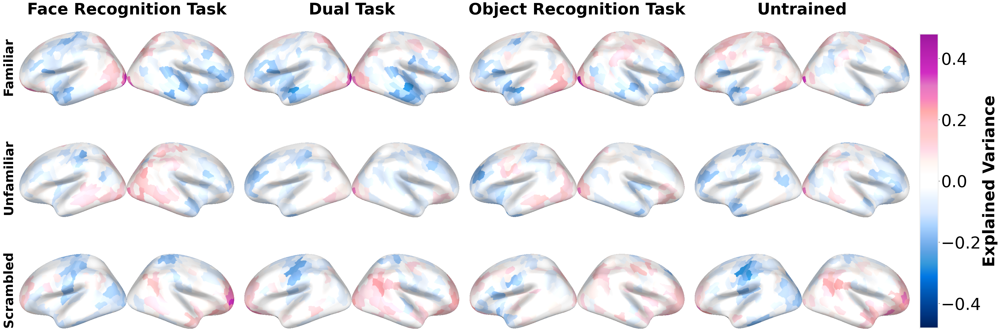

In [566]:
from matplotlib.colors import Normalize

fig, axs = plt.subplots(3, 4, figsize=(40, 16))
for i , stimuli_type in enumerate(["fam", "unfamiliar", "scrambled"]):
    for j, ann_analysis_type in enumerate(["with-meg_pretrained trained", "meg_stimuli_faces imagenet", "None imagenet",  "None untrained"]):
        axs[i, j].imshow(list_views[ann_analysis_type + " " + stimuli_type + " lateral"])
        axs[i, j].axis('off')


# # Add labels for each subplot
axs[0, 0].set_title('Face Recognition Task', fontsize=50, fontweight='bold', y=1.2)
axs[0, 1].set_title('Dual Task', fontsize=50, fontweight='bold', y=1.2)
axs[0, 2].set_title('Object Recognition Task', fontsize=50, fontweight='bold', y=1.2)
axs[0, 3].set_title('Untrained', fontsize=50, fontweight='bold', y=1.2)

ax2 = fig.add_axes([0.017, 0.665, 0.02, 0.2])
ax2.axis('off')
ax2.set_title('Familiar', fontsize=40, fontweight='bold', rotation='vertical', y=0.25, x = -0.4)
axs[1, 0].set_title('Unfamiliar', fontsize=40, fontweight='bold', rotation='vertical', y=0.05, x = -0.05)
axs[2, 0].set_title('Scrambled', fontsize=40, fontweight='bold', rotation='vertical', y=0.03, x = -0.05)


cbar_ax = fig.add_axes([1, 0.08, 0.02, 0.8])
norm = Normalize(vmin=-0.48, vmax=0.48)
cbar = plt.colorbar(cmap_2, cax=cbar_ax)
cbar.set_label('Explained Variance', fontsize=50, fontweight='bold')

plt.gca().set_facecolor('white')  # Set plot background color to white
plt.gcf().set_facecolor('white')

# Adjust layout and display the plot
plt.tight_layout()
# plt.savefig(os.path.join(plots_folder, f'rsa_results_lateral.png'), dpi=300, bbox_inches='tight')
plt.show()



/var/folders/dy/yqsbvh6j7r7gz1ktnr8gx4g80000gn/T/ipykernel_90346/414632661.py:32: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


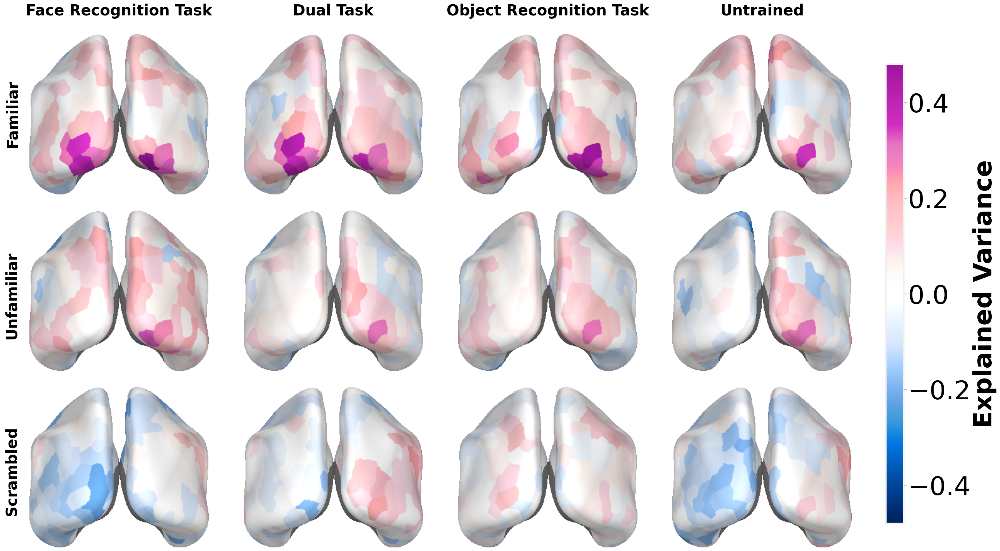

In [569]:
from matplotlib.colors import Normalize

fig, axs = plt.subplots(3, 4, figsize=(25, 16))
for i , stimuli_type in enumerate(["fam", "unfamiliar", "scrambled"]):
    for j, ann_analysis_type in enumerate(["with-meg_pretrained trained", "meg_stimuli_faces imagenet", "None imagenet",  "None untrained"]):
        axs[i, j].imshow(list_views[ann_analysis_type + " " + stimuli_type + " caudal"])
        axs[i, j].axis('off')


# # Add labels for each subplot
axs[0, 0].set_title('Face Recognition Task', fontsize=30, fontweight='bold', y=1.1)
axs[0, 1].set_title('Dual Task', fontsize=30, fontweight='bold', y=1.1)
axs[0, 2].set_title('Object Recognition Task', fontsize=30, fontweight='bold', y=1.1)
axs[0, 3].set_title('Untrained', fontsize=30, fontweight='bold', y=1.1)

ax2 = fig.add_axes([0.017, 0.665, 0.02, 0.2])
ax2.axis('off')
ax2.set_title('Familiar', fontsize=30, fontweight='bold', rotation='vertical', y=0.3, x = 0.5)
axs[1, 0].set_title('Unfamiliar', fontsize=30, fontweight='bold', rotation='vertical', y=0.2, x = -0.1)
axs[2, 0].set_title('Scrambled', fontsize=30, fontweight='bold', rotation='vertical', y=0.2, x = -0.1)


cbar_ax = fig.add_axes([1, 0.07, 0.02, 0.8])
norm = Normalize(vmin=-0.48, vmax=0.48)
cbar = plt.colorbar(cmap_2, cax=cbar_ax)
cbar.set_label('Explained Variance', fontsize=50, fontweight='bold')

plt.gca().set_facecolor('white')  # Set plot background color to white
plt.gcf().set_facecolor('white')

# Adjust layout and display the plot
plt.tight_layout()
# plt.savefig(os.path.join(plots_folder, f'FaceNet_brain_maps_caudal.png'), dpi=300)
plt.show()



/var/folders/dy/yqsbvh6j7r7gz1ktnr8gx4g80000gn/T/ipykernel_90346/253516058.py:31: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


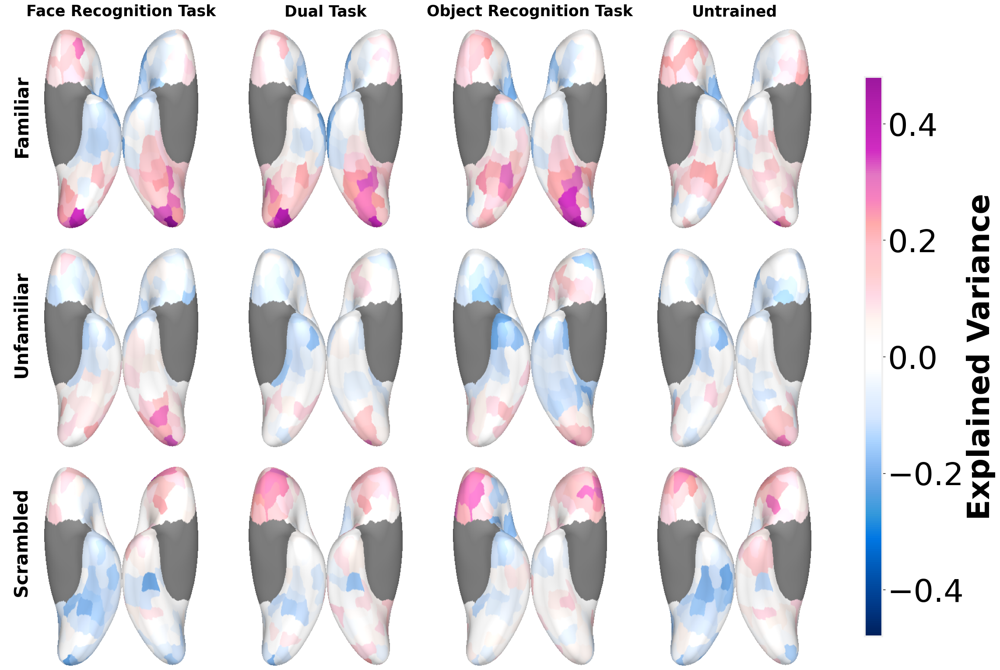

In [579]:
from matplotlib.colors import Normalize

fig, axs = plt.subplots(3, 4, figsize=(20, 16))
for i , stimuli_type in enumerate(["fam", "unfamiliar", "scrambled"]):
    for j, ann_analysis_type in enumerate(["with-meg_pretrained trained", "meg_stimuli_faces imagenet", "None imagenet",  "None untrained"]):
        axs[i, j].imshow(list_views[ann_analysis_type + " " + stimuli_type + " ventral"])
        axs[i, j].axis('off')


# # Add labels for each subplot
axs[0, 0].set_title('Face Recognition Task', fontsize=25, fontweight='bold', y=1.05)
axs[0, 1].set_title('Dual Task', fontsize=25, fontweight='bold', y=1.05)
axs[0, 2].set_title('Object Recognition Task', fontsize=25, fontweight='bold', y=1.05)
axs[0, 3].set_title('Untrained', fontsize=25, fontweight='bold', y=1.05)

ax2 = fig.add_axes([0.017, 0.665, 0.02, 0.2])
ax2.axis('off')
ax2.set_title('Familiar', fontsize=30, fontweight='bold', rotation='vertical', y=0.45, x = 1)
axs[1, 0].set_title('Unfamiliar', fontsize=30, fontweight='bold', rotation='vertical', y=0.35, x = -0.15)
axs[2, 0].set_title('Scrambled', fontsize=30, fontweight='bold', rotation='vertical', y=0.35, x = -0.15)


cbar_ax = fig.add_axes([1, 0.07, 0.02, 0.8])
norm = Normalize(vmin=-0.48, vmax=0.48)
cbar = plt.colorbar(cmap_2, cax=cbar_ax)
cbar.set_label('Explained Variance', fontsize=50, fontweight='bold')
plt.gca().set_facecolor('white')  # Set plot background color to white
plt.gcf().set_facecolor('white')

# Adjust layout and display the plot
plt.tight_layout()
# plt.savefig(os.path.join(plots_folder, f'FaceNet_brain_maps_ventral.png'), dpi=300)
plt.show()



In [32]:
# Extract fusiform region data
fusiform_labels = [i for i, label in enumerate(rois) if "fusiform" in label.name.split('_')[0]]
region_name = [rois[i].name for i in fusiform_labels]


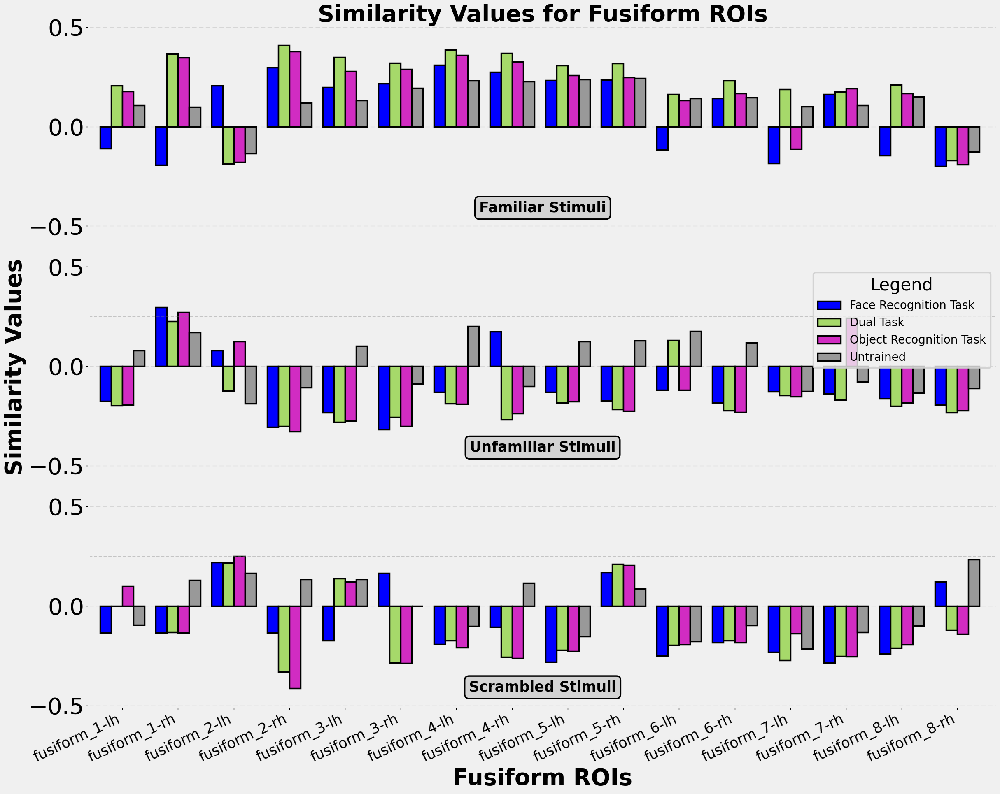

In [81]:
model = "FaceNet"
labels = [ "Face Recognition Task", "Dual Task", "Object Recognition Task",  "Untrained",]
ann_analysis_types = ["with-meg_pretrained",  "None", "meg_stimuli_faces", "None", ]
activations = ["trained", "imagenet", "imagenet", "untrained",]
stimuli_types = ["fam", "unfamiliar", "scrambled"]
colors = [ spring[1], green_bull[5], pink_ocean[-4], grey[2], the_blues[5], the_blues[8],]

time_segment = 550
sampling_diff = 50

# colors = [one_piece[0], one_piece[2], one_piece[12], one_piece[-1]]

fig, ax = plt.subplots(3, 1, figsize=(25, 20))
axs = ax.flatten()
for stimuli_idx, stimuli_type in enumerate(stimuli_types):
    sim_values = []
    for ann_analysis_type, activation_type in zip(ann_analysis_types, activations):
        data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_{stimuli_type}_{time_segment}_50.npy")
        data = np.load(data_file)
        data[data[:, :, :, 1] > 0.05] = 0
        max_values = np.max(data[:, 2, :, 0], axis=1)
        min_values = np.min(data[:, 2, :, 0], axis=1)
        extreme_values = np.where(np.abs(min_values) > max_values, min_values, max_values)
        values = extreme_values
        fusiform_values = values[fusiform_labels]
        noise_ceiling = np.load(os.path.join(similarity_folder, f"meg_{stimuli_type}_upper_noise_ceiling_{time_segment}_50.npy"))
        noise_ceilings = noise_ceiling[fusiform_labels]
        fusiform_values = values[fusiform_labels][:, np.newaxis]/noise_ceilings
        fusiform_values = np.squeeze(fusiform_values)
        sim_values.append(fusiform_values)
    bar_width = 0.8/len(sim_values)
    for idx_analysis in range(len(ann_analysis_types)):
        analysis_sim_values = sim_values[idx_analysis]
        axs[stimuli_idx].bar(np.arange(len(analysis_sim_values))+bar_width*idx_analysis, analysis_sim_values, width=bar_width, edgecolor='black', color=colors[idx_analysis], label=labels[idx_analysis])
    if stimuli_idx == 1:
        axs[stimuli_idx].set_ylabel("Similarity Values", fontsize=40, fontweight='bold')
        axs[stimuli_idx].legend(loc='upper right', title="Legend", fontsize=20)

    axs[stimuli_idx].set_xticks(np.arange(len(fusiform_labels)) + 1.5 * bar_width)  # Adjust the X ticks to be in the middle of grouped bars
    if stimuli_idx == 2:
        axs[stimuli_idx].set_xlabel('Fusiform ROIs', fontsize=40, fontweight='bold')
        axs[stimuli_idx].set_xticklabels([rois[i].name for i in fusiform_labels], fontsize=25, rotation=25, ha="right")

    else:
        axs[stimuli_idx].set_xticklabels([])
        axs[stimuli_idx].tick_params(axis='x', which='both', length=0)

        # axs[stimuli_idx].spines['bottom'].set_visible(False)
    if stimuli_idx == 0:
        axs[stimuli_idx].set_title(f'Similarity Values for Fusiform ROIs', fontsize=40, loc='center', pad=10, fontweight='bold')
    axs[stimuli_idx].set_xlim(-0.3, len(fusiform_labels))
    axs[stimuli_idx].tick_params(axis="y", which='major', labelsize=40)
    axs[stimuli_idx].set_ylim(-0.51, 0.5)
    axs[stimuli_idx].grid(False)
    axs[stimuli_idx].grid(axis='y', linestyle='--', alpha=0.7)
    axs[stimuli_idx].axhline(0.25, color='grey', linewidth=0.7, alpha=0.4, linestyle='--')
    axs[stimuli_idx].axhline(-0.25, color='grey', linewidth=0.7, alpha=0.4, linestyle='--')

for idx, label in enumerate(['Familiar Stimuli', 'Unfamiliar Stimuli', 'Scrambled Stimuli']):
    bbox_props = dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="lightgrey")
    axs[idx].text(0.5, 0.1, label, fontsize=25, fontweight='bold', ha="center", va="center", transform=axs[idx].transAxes, bbox=bbox_props)



# # # Adjust layout
plt.tight_layout()  
# plt.savefig(os.path.join(plots_folder, f'FaceNet_fusiform_similarity_values.png'), dpi=300)
plt.show()

In [84]:
# Extract occipital region data
occipital_labels = [i for i, label in enumerate(rois) if "occipital" in label.name.split('_')[0]]
region_name = [rois[i].name for i in occipital_labels]

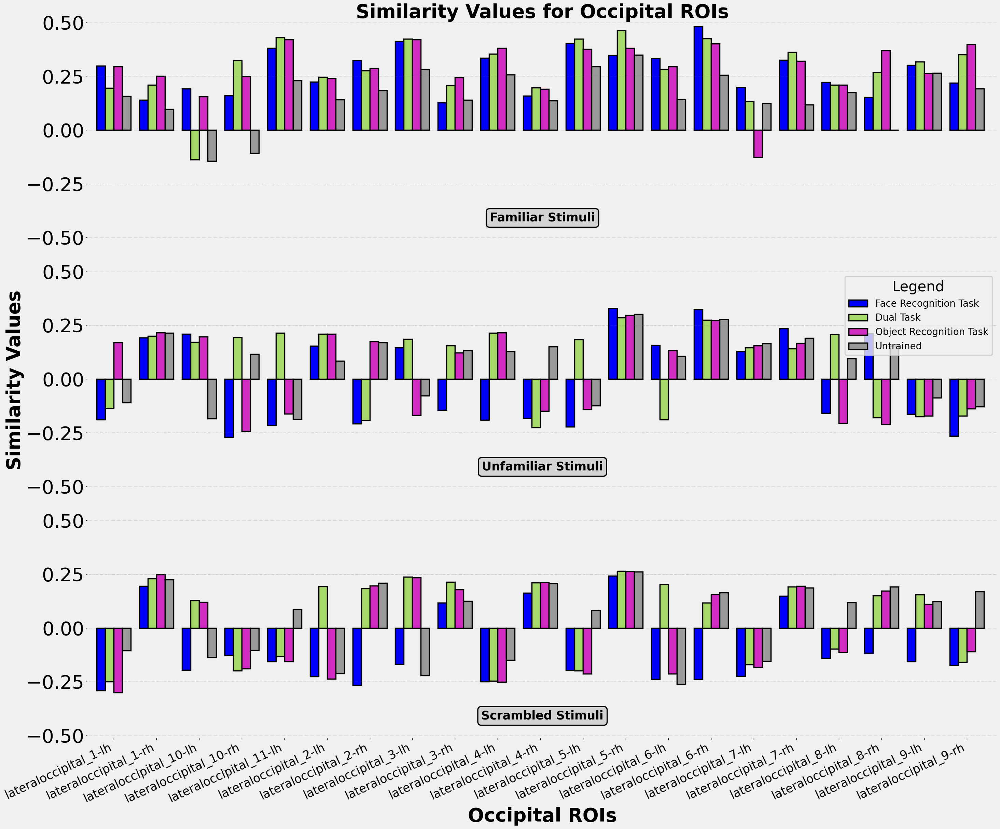

In [88]:
model = "FaceNet"
labels = [ "Face Recognition Task", "Dual Task", "Object Recognition Task",  "Untrained",]
ann_analysis_types = ["with-meg_pretrained",  "None", "meg_stimuli_faces", "None", ]
activations = ["trained", "imagenet", "imagenet", "untrained",]
stimuli_types = ["fam", "unfamiliar", "scrambled"]
colors = [ spring[1], green_bull[5], pink_ocean[-4], grey[2], the_blues[5], the_blues[8],]

time_segment = 550
sampling_diff = 50
# colors = [one_piece[0], one_piece[2], one_piece[12], one_piece[-1]]
fig, ax = plt.subplots(3, 1, figsize=(30, 25))
axs = ax.flatten()
for stimuli_idx, stimuli_type in enumerate(stimuli_types):
    sim_values = []
    for ann_analysis_type, activation_type in zip(ann_analysis_types, activations):
        data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_{stimuli_type}_{time_segment}_50.npy")
        data = np.load(data_file)
        data[data[:, :, :, 1] > 0.05] = 0
        max_values = np.max(data[:, 2, :, 0], axis=1)
        min_values = np.min(data[:, 2, :, 0], axis=1)
        extreme_values = np.where(np.abs(min_values) > max_values, min_values, max_values)
        values = extreme_values
        occipital_values = values[occipital_labels]
        noise_ceiling = np.load(os.path.join(similarity_folder, f"meg_{stimuli_type}_upper_noise_ceiling_{time_segment}_50.npy"))
        noise_ceilings = noise_ceiling[occipital_labels]
        occipital_values = values[occipital_labels][:, np.newaxis]/noise_ceilings
        occipital_values = np.squeeze(occipital_values)
        sim_values.append(occipital_values)
    bar_width = 0.8/len(sim_values)
    for idx_analysis in range(len(ann_analysis_types)):
        analysis_sim_values = sim_values[idx_analysis]
        axs[stimuli_idx].bar(np.arange(len(analysis_sim_values))+bar_width*idx_analysis, analysis_sim_values, width=bar_width, edgecolor='black', color=colors[idx_analysis], label=labels[idx_analysis])
    axs[stimuli_idx].set_ylim(-0.13, 0.13)
    if stimuli_idx == 1:
        axs[stimuli_idx].set_ylabel("Similarity Values", fontsize=40, fontweight='bold')
        axs[stimuli_idx].legend(loc='upper right', title="Legend", fontsize=20)
    axs[stimuli_idx].set_xticks(np.arange(len(occipital_labels)) + 1.5 * bar_width)  # Adjust the X ticks to be in the middle of grouped bars
    if stimuli_idx == 2:
        axs[stimuli_idx].set_xlabel('Occipital ROIs', fontsize=40, fontweight='bold')
        axs[stimuli_idx].set_xticklabels([rois[i].name for i in occipital_labels], fontsize=25, rotation=25, ha="right")
    else:
        axs[stimuli_idx].set_xticklabels([])
        axs[stimuli_idx].tick_params(axis='x', which='both', length=0)
        # axs[stimuli_idx].spines['bottom'].set_visible(False)
    if stimuli_idx == 0:
        axs[stimuli_idx].set_title(f'Similarity Values for Occipital ROIs', fontsize=40, loc='center', pad=10, fontweight='bold')
    axs[stimuli_idx].set_xlim(-0.3, len(occipital_labels))
    axs[stimuli_idx].tick_params(axis="y", which='major', labelsize=40)
    axs[stimuli_idx].set_ylim(-0.51, 0.5)
    axs[stimuli_idx].grid(False)
    axs[stimuli_idx].grid(axis='y', linestyle='--', alpha=0.7)
    axs[stimuli_idx].axhline(0.25, color='grey', linewidth=0.7, alpha=0.4, linestyle='--')
    axs[stimuli_idx].axhline(-0.25, color='grey', linewidth=0.7, alpha=0.4, linestyle='--')

for idx, label in enumerate(['Familiar Stimuli', 'Unfamiliar Stimuli', 'Scrambled Stimuli']):
    bbox_props = dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="lightgrey")
    axs[idx].text(0.5, 0.1, label, fontsize=25, fontweight='bold', ha="center", va="center", transform=axs[idx].transAxes, bbox=bbox_props)



# # # Adjust layout
plt.tight_layout()  
# plt.savefig(os.path.join(plots_folder, f'FaceNet_occipital_similarity_values.png'), dpi=300)
plt.show()

In [98]:
# Extract IT region data
inferiortemporal_labels = [i for i, label in enumerate(rois) if "inferiortemporal" in label.name.split('_')[0]]
region_name = [rois[i].name for i in inferiortemporal_labels]

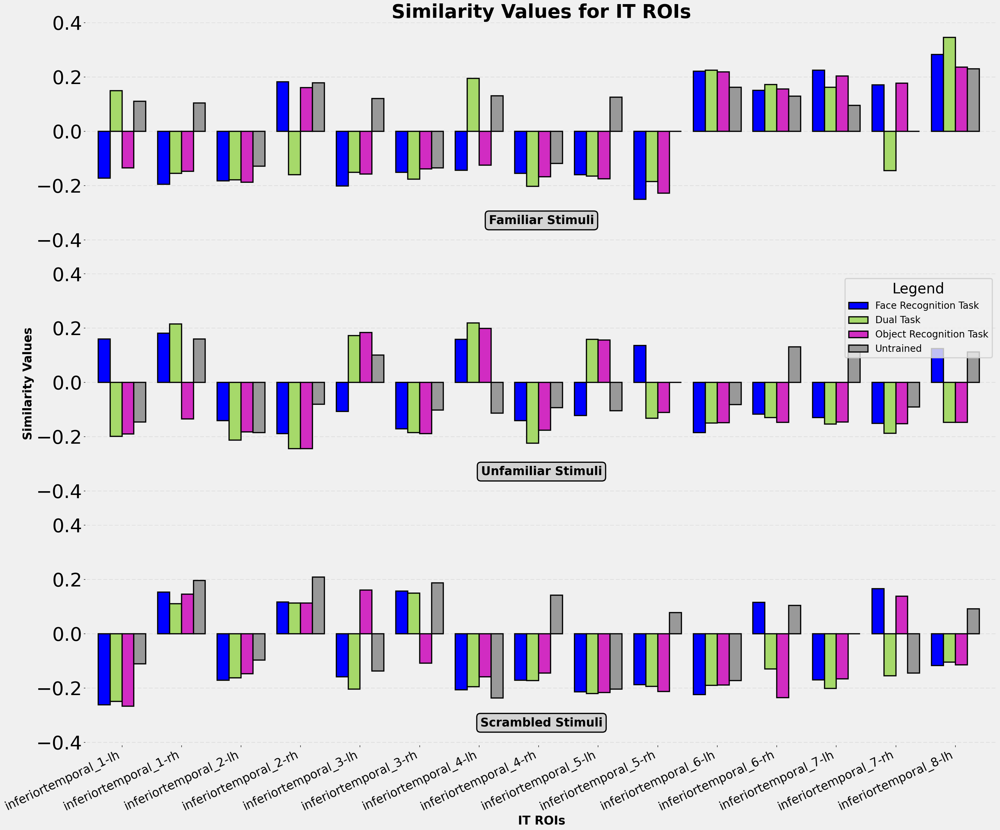

In [103]:
model = "FaceNet"
labels = [ "Face Recognition Task", "Dual Task", "Object Recognition Task",  "Untrained",]
ann_analysis_types = ["with-meg_pretrained",  "None", "meg_stimuli_faces", "None", ]
activations = ["trained", "imagenet", "imagenet", "untrained",]
stimuli_types = ["fam", "unfamiliar", "scrambled"]

time_segment = 550
sampling_diff = 50
colors = [ spring[1], green_bull[5], pink_ocean[-4], grey[2], the_blues[5], the_blues[8],]
fig, ax = plt.subplots(3, 1, figsize=(30, 25))
axs = ax.flatten()
for stimuli_idx, stimuli_type in enumerate(stimuli_types):
    sim_values = []
    for ann_analysis_type, activation_type in zip(ann_analysis_types, activations):
        data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_{stimuli_type}_{time_segment}_50.npy")
        data = np.load(data_file)
        data[data[:, :, :, 1] > 0.05] = 0
        max_values = np.max(data[:, 2, :, 0], axis=1)
        min_values = np.min(data[:, 2, :, 0], axis=1)
        extreme_values = np.where(np.abs(min_values) > max_values, min_values, max_values)
        values = extreme_values
        it_values = values[inferiortemporal_labels]
        noise_ceiling = np.load(os.path.join(similarity_folder, f"meg_{stimuli_type}_upper_noise_ceiling_{time_segment}_50.npy"))
        noise_ceilings = noise_ceiling[inferiortemporal_labels]
        it_values = values[inferiortemporal_labels][:, np.newaxis]/noise_ceilings
        it_values = np.squeeze(it_values)
        sim_values.append(it_values)
    bar_width = 0.8/len(sim_values)
    for idx_analysis in range(len(ann_analysis_types)):
        analysis_sim_values = sim_values[idx_analysis]
        axs[stimuli_idx].bar(np.arange(len(analysis_sim_values))+bar_width*idx_analysis, analysis_sim_values, width=bar_width, edgecolor='black', color=colors[idx_analysis], label=labels[idx_analysis])
    axs[stimuli_idx].set_ylim(-0.10, 0.10)
    if stimuli_idx == 1:
        axs[stimuli_idx].set_ylabel("Similarity Values", fontsize=25, fontweight='bold')
        axs[stimuli_idx].legend(loc='upper right', title="Legend", fontsize=20)
    axs[stimuli_idx].set_xticks(np.arange(len(inferiortemporal_labels)) + 1.5 * bar_width)  # Adjust the X ticks to be in the middle of grouped bars
    if stimuli_idx == 2:
        axs[stimuli_idx].set_xlabel('IT ROIs', fontsize=25, fontweight='bold')
        axs[stimuli_idx].set_xticklabels([rois[i].name for i in inferiortemporal_labels], fontsize=25, rotation=25, ha="right")
    else:
        axs[stimuli_idx].set_xticklabels([])
        axs[stimuli_idx].tick_params(axis='x', which='both', length=0)
        # axs[stimuli_idx].spines['bottom'].set_visible(False)
    if stimuli_idx == 0:
        axs[stimuli_idx].set_title(f'Similarity Values for IT ROIs', fontsize=40, loc='center', pad=10, fontweight='bold')
    axs[stimuli_idx].set_xlim(-0.3, len(inferiortemporal_labels))
    axs[stimuli_idx].tick_params(axis="y", which='major', labelsize=40)
    axs[stimuli_idx].set_ylim(-0.41, 0.4)
    axs[stimuli_idx].grid(False)
    axs[stimuli_idx].grid(axis='y', linestyle='--', alpha=0.7)
for idx, label in enumerate(['Familiar Stimuli', 'Unfamiliar Stimuli', 'Scrambled Stimuli']):
    bbox_props = dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="lightgrey")
    axs[idx].text(0.5, 0.1, label, fontsize=25, fontweight='bold', ha="center", va="center", transform=axs[idx].transAxes, bbox=bbox_props)



# # # Adjust layout
plt.tight_layout()  
# plt.savefig(os.path.join(plots_folder, f'FaceNet_IT_similarity_values.png'), dpi=300)
plt.show()

In [90]:
# Extract IT region data
inferiorparietal_labels = [i for i, label in enumerate(rois) if "inferiorparietal" in label.name.split('_')[0]]
region_name = [rois[i].name for i in inferiorparietal_labels]

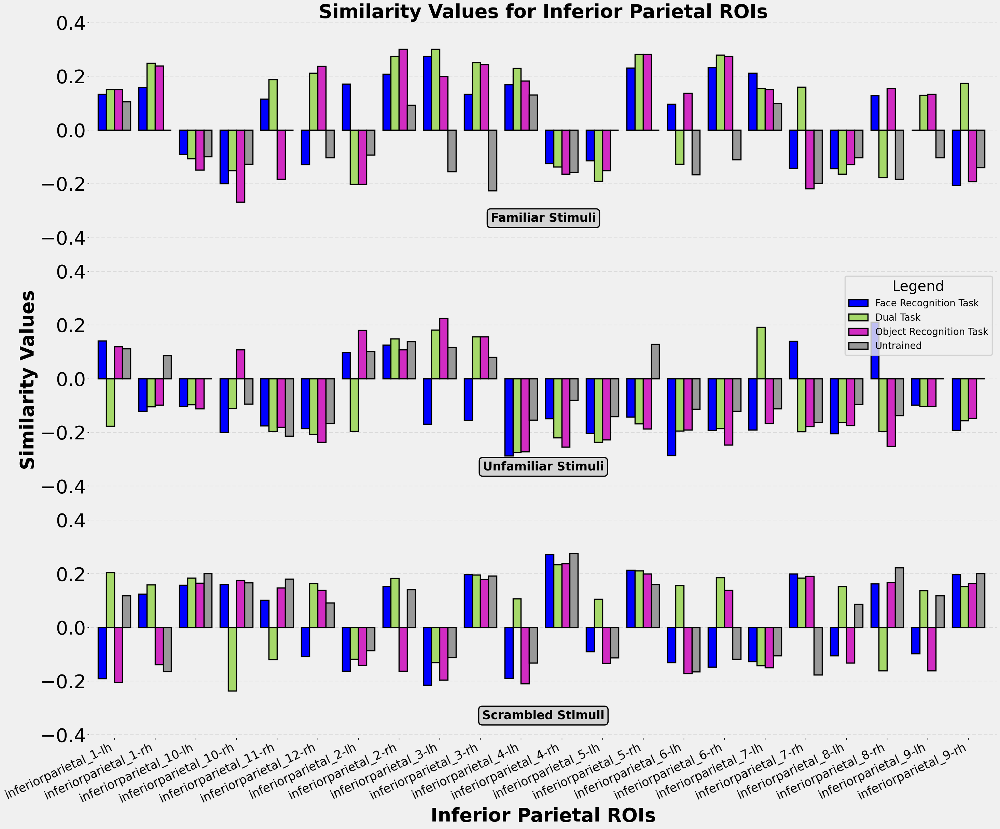

In [104]:
model = "FaceNet"
labels = [ "Face Recognition Task", "Dual Task", "Object Recognition Task",  "Untrained",]
ann_analysis_types = ["with-meg_pretrained",  "None", "meg_stimuli_faces", "None", ]
activations = ["trained", "imagenet", "imagenet", "untrained",]
stimuli_types = ["fam", "unfamiliar", "scrambled"]

time_segment = 550
sampling_diff = 50
colors = [ spring[1], green_bull[5], pink_ocean[-4], grey[2], the_blues[5], the_blues[8],]
fig, ax = plt.subplots(3, 1, figsize=(30, 25))
axs = ax.flatten()
for stimuli_idx, stimuli_type in enumerate(stimuli_types):
    sim_values = []
    for ann_analysis_type, activation_type in zip(ann_analysis_types, activations):
        data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_{stimuli_type}_{time_segment}_50.npy")
        data = np.load(data_file)
        data[data[:, :, :, 1] > 0.05] = 0
        max_values = np.max(data[:, 2, :, 0], axis=1)
        min_values = np.min(data[:, 2, :, 0], axis=1)
        extreme_values = np.where(np.abs(min_values) > max_values, min_values, max_values)
        values = extreme_values
        partial_values = values[inferiorparietal_labels]
        noise_ceiling = np.load(os.path.join(similarity_folder, f"meg_{stimuli_type}_upper_noise_ceiling_{time_segment}_50.npy"))
        noise_ceilings = noise_ceiling[inferiorparietal_labels]
        partial_values = values[inferiorparietal_labels][:, np.newaxis]/noise_ceilings
        partial_values = np.squeeze(partial_values)
        sim_values.append(partial_values)
    bar_width = 0.8/len(sim_values)
    for idx_analysis in range(len(ann_analysis_types)):
        analysis_sim_values = sim_values[idx_analysis]
        axs[stimuli_idx].bar(np.arange(len(analysis_sim_values))+bar_width*idx_analysis, analysis_sim_values, width=bar_width, edgecolor='black', color=colors[idx_analysis], label=labels[idx_analysis])
    axs[stimuli_idx].set_ylim(-0.10, 0.10)
    if stimuli_idx == 1:
        axs[stimuli_idx].set_ylabel("Similarity Values", fontsize=40, fontweight='bold')
        axs[stimuli_idx].legend(loc='upper right', title="Legend", fontsize=20)
    axs[stimuli_idx].set_xticks(np.arange(len(inferiorparietal_labels)) + 1.5 * bar_width)  # Adjust the X ticks to be in the middle of grouped bars
    if stimuli_idx == 2:
        axs[stimuli_idx].set_xlabel('Inferior Parietal ROIs', fontsize=40, fontweight='bold')
        axs[stimuli_idx].set_xticklabels([rois[i].name for i in inferiorparietal_labels], fontsize=25, rotation=25, ha="right")
    else:
        axs[stimuli_idx].set_xticklabels([])
        axs[stimuli_idx].tick_params(axis='x', which='both', length=0)
        # axs[stimuli_idx].spines['bottom'].set_visible(False)
    if stimuli_idx == 0:
        axs[stimuli_idx].set_title(f'Similarity Values for Inferior Parietal ROIs', fontsize=40, loc='center', pad=10, fontweight='bold')
    axs[stimuli_idx].set_xlim(-0.3, len(partial_values))
    axs[stimuli_idx].tick_params(axis="y", which='major', labelsize=40)
    axs[stimuli_idx].set_ylim(-0.41, 0.4)
    axs[stimuli_idx].grid(False)
    axs[stimuli_idx].grid(axis='y', linestyle='--', alpha=0.7)

for idx, label in enumerate(['Familiar Stimuli', 'Unfamiliar Stimuli', 'Scrambled Stimuli']):
    bbox_props = dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="lightgrey")
    axs[idx].text(0.5, 0.1, label, fontsize=25, fontweight='bold', ha="center", va="center", transform=axs[idx].transAxes, bbox=bbox_props)



# # # Adjust layout
plt.tight_layout()  
# plt.savefig(os.path.join(plots_folder, f'FaceNet_Inferior_Parietal_similarity_values.png'), dpi=300)
plt.show()

In [565]:
# Extract IT region data
unique_labels = []
for i, label in enumerate(rois):
    unique_labels.append(label.name.split('_')[0])
print(np.unique(unique_labels))

['bankssts' 'caudalanteriorcingulate' 'caudalmiddlefrontal' 'cuneus'
 'entorhinal' 'frontalpole' 'fusiform' 'inferiorparietal'
 'inferiortemporal' 'insula' 'isthmuscingulate' 'lateraloccipital'
 'lateralorbitofrontal' 'lingual' 'medialorbitofrontal' 'middletemporal'
 'paracentral' 'parahippocampal' 'parsopercularis' 'parsorbitalis'
 'parstriangularis' 'pericalcarine' 'postcentral' 'posteriorcingulate'
 'precentral' 'precuneus' 'rostralanteriorcingulate'
 'rostralmiddlefrontal' 'superiorfrontal' 'superiorparietal'
 'superiortemporal' 'supramarginal' 'temporalpole' 'transversetemporal'
 'unknown-lh' 'unknown-rh']


In [105]:
bankssts_labels = [i for i, label in enumerate(rois) if "bankssts" in label.name.split('_')[0]]
region_name = [rois[i].name for i in bankssts_labels]

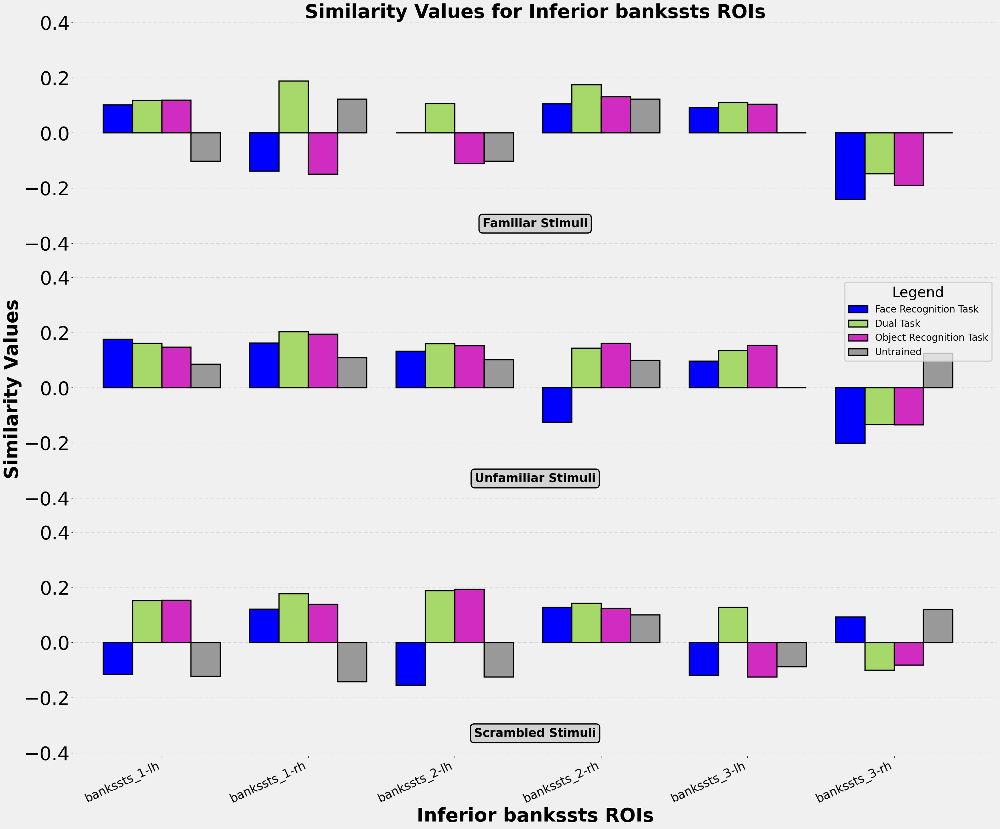

In [110]:
model = "FaceNet"
labels = [ "Face Recognition Task", "Dual Task", "Object Recognition Task",  "Untrained",]
ann_analysis_types = ["with-meg_pretrained",  "None", "meg_stimuli_faces", "None", ]
activations = ["trained", "imagenet", "imagenet", "untrained",]
stimuli_types = ["fam", "unfamiliar", "scrambled"]

time_segment = 550
sampling_diff = 50
colors = [ spring[1], green_bull[5], pink_ocean[-4], grey[2], the_blues[5], the_blues[8],]
fig, ax = plt.subplots(3, 1, figsize=(30, 25))
axs = ax.flatten()
for stimuli_idx, stimuli_type in enumerate(stimuli_types):
    sim_values = []
    for ann_analysis_type, activation_type in zip(ann_analysis_types, activations):
        data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_{stimuli_type}_{time_segment}_50.npy")
        data = np.load(data_file)
        data[data[:, :, :, 1] > 0.05] = 0
        max_values = np.max(data[:, 2, :, 0], axis=1)
        min_values = np.min(data[:, 2, :, 0], axis=1)
        extreme_values = np.where(np.abs(min_values) > max_values, min_values, max_values)
        values = extreme_values
        bankssts_values = values[bankssts_labels]
        noise_ceiling = np.load(os.path.join(similarity_folder, f"meg_{stimuli_type}_upper_noise_ceiling_{time_segment}_50.npy"))
        noise_ceilings = noise_ceiling[bankssts_labels]
        bankssts_values = values[bankssts_labels][:, np.newaxis]/noise_ceilings
        bankssts_values = np.squeeze(bankssts_values)

        sim_values.append(bankssts_values)
    bar_width = 0.8/len(sim_values)
    for idx_analysis in range(len(ann_analysis_types)):
        analysis_sim_values = sim_values[idx_analysis]
        axs[stimuli_idx].bar(np.arange(len(analysis_sim_values))+bar_width*idx_analysis, analysis_sim_values, width=bar_width, edgecolor='black', color=colors[idx_analysis], label=labels[idx_analysis])
    if stimuli_idx == 1:
        axs[stimuli_idx].set_ylabel("Similarity Values", fontsize=40, fontweight='bold')
        axs[stimuli_idx].legend(loc='upper right', title="Legend", fontsize=20)
    axs[stimuli_idx].set_xticks(np.arange(len(bankssts_labels)) + 1.5 * bar_width)  # Adjust the X ticks to be in the middle of grouped bars
    if stimuli_idx == 2:
        axs[stimuli_idx].set_xlabel('Inferior bankssts ROIs', fontsize=40, fontweight='bold')
        axs[stimuli_idx].set_xticklabels([rois[i].name for i in bankssts_labels], fontsize=25, rotation=25, ha="right")
    else:
        axs[stimuli_idx].set_xticklabels([])
        axs[stimuli_idx].tick_params(axis='x', which='both', length=0)
        # axs[stimuli_idx].spines['bottom'].set_visible(False)
    if stimuli_idx == 0:
        axs[stimuli_idx].set_title(f'Similarity Values for Inferior bankssts ROIs', fontsize=40, loc='center', pad=10, fontweight='bold')
    axs[stimuli_idx].set_xlim(-0.3, len(bankssts_values))
    axs[stimuli_idx].tick_params(axis="y", which='major', labelsize=40)
    axs[stimuli_idx].set_ylim(-0.41, 0.4)
    axs[stimuli_idx].grid(False)
    axs[stimuli_idx].grid(axis='y', linestyle='--', alpha=0.7)
for idx, label in enumerate(['Familiar Stimuli', 'Unfamiliar Stimuli', 'Scrambled Stimuli']):
    bbox_props = dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="lightgrey")
    axs[idx].text(0.5, 0.1, label, fontsize=25, fontweight='bold', ha="center", va="center", transform=axs[idx].transAxes, bbox=bbox_props)



# # # Adjust layout
plt.tight_layout()  
# plt.savefig(os.path.join(plots_folder, f'FaceNet_Inferior_bankssts_similarity_values.png'), dpi=300)
plt.show()

In [111]:
middletemporal_labels = [i for i, label in enumerate(rois) if "middletemporal" in label.name.split('_')[0]]
region_name = [rois[i].name for i in middletemporal_labels]

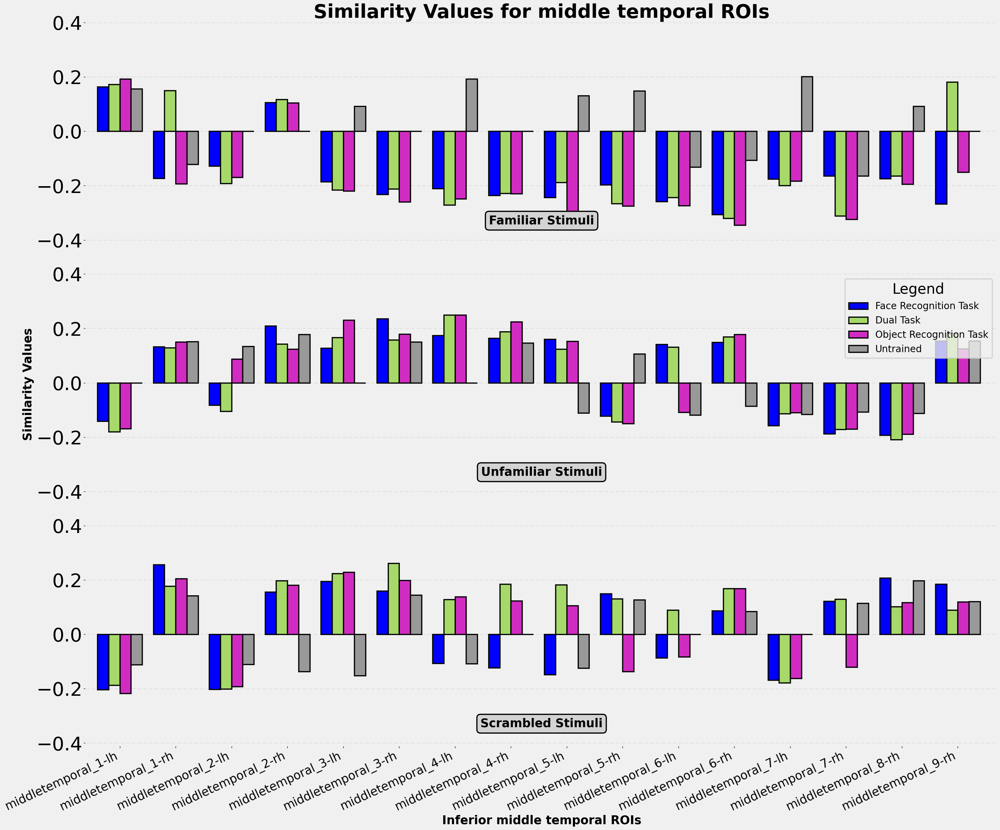

In [114]:
model = "FaceNet"
labels = [ "Face Recognition Task", "Dual Task", "Object Recognition Task",  "Untrained",]
ann_analysis_types = ["with-meg_pretrained",  "None", "meg_stimuli_faces", "None", ]
activations = ["trained", "imagenet", "imagenet", "untrained",]
stimuli_types = ["fam", "unfamiliar", "scrambled"]

time_segment = 550
sampling_diff = 50
colors = [ spring[1], green_bull[5], pink_ocean[-4], grey[2], the_blues[5], the_blues[8],]
fig, ax = plt.subplots(3, 1, figsize=(30, 25))
axs = ax.flatten()
for stimuli_idx, stimuli_type in enumerate(stimuli_types):
    sim_values = []
    for ann_analysis_type, activation_type in zip(ann_analysis_types, activations):
        data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_{stimuli_type}_{time_segment}_50.npy")
        data = np.load(data_file)
        data[data[:, :, :, 1] > 0.05] = 0
        max_values = np.max(data[:, 2, :, 0], axis=1)
        min_values = np.min(data[:, 2, :, 0], axis=1)
        extreme_values = np.where(np.abs(min_values) > max_values, min_values, max_values)
        values = extreme_values
        middletemporal_values = values[middletemporal_labels]
        noise_ceiling = np.load(os.path.join(similarity_folder, f"meg_{stimuli_type}_upper_noise_ceiling_{time_segment}_50.npy"))
        noise_ceilings = noise_ceiling[middletemporal_labels]
        middletemporal_values = values[middletemporal_labels][:, np.newaxis]/noise_ceilings
        middletemporal_values = np.squeeze(middletemporal_values)
        sim_values.append(middletemporal_values)
    bar_width = 0.8/len(sim_values)
    for idx_analysis in range(len(ann_analysis_types)):
        analysis_sim_values = sim_values[idx_analysis]
        axs[stimuli_idx].bar(np.arange(len(analysis_sim_values))+bar_width*idx_analysis, analysis_sim_values, width=bar_width, edgecolor='black', color=colors[idx_analysis], label=labels[idx_analysis])
    axs[stimuli_idx].set_ylim(-0.10, 0.10)
    if stimuli_idx == 1:
        axs[stimuli_idx].set_ylabel("Similarity Values", fontsize=25, fontweight='bold')
        axs[stimuli_idx].legend(loc='upper right', title="Legend", fontsize=20)
    axs[stimuli_idx].set_xticks(np.arange(len(middletemporal_labels)) + 1.5 * bar_width)  # Adjust the X ticks to be in the middle of grouped bars
    if stimuli_idx == 2:
        axs[stimuli_idx].set_xlabel('Inferior middle temporal ROIs', fontsize=25, fontweight='bold')
        axs[stimuli_idx].set_xticklabels([rois[i].name for i in middletemporal_labels], fontsize=25, rotation=25, ha="right")
    else:
        axs[stimuli_idx].set_xticklabels([])
        axs[stimuli_idx].tick_params(axis='x', which='both', length=0)
        # axs[stimuli_idx].spines['bottom'].set_visible(False)
    if stimuli_idx == 0:
        axs[stimuli_idx].set_title(f'Similarity Values for middle temporal ROIs', fontsize=40, loc='center', pad=10, fontweight='bold')
    axs[stimuli_idx].set_xlim(-0.3, len(middletemporal_labels))
    axs[stimuli_idx].tick_params(axis="y", which='major', labelsize=40)
    axs[stimuli_idx].set_ylim(-0.41, 0.4)
    axs[stimuli_idx].grid(False)
    axs[stimuli_idx].grid(axis='y', linestyle='--', alpha=0.7)

for idx, label in enumerate(['Familiar Stimuli', 'Unfamiliar Stimuli', 'Scrambled Stimuli']):
    bbox_props = dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="lightgrey")
    axs[idx].text(0.5, 0.1, label, fontsize=25, fontweight='bold', ha="center", va="center", transform=axs[idx].transAxes, bbox=bbox_props)



# # # Adjust layout
plt.tight_layout()  
# plt.savefig(os.path.join(plots_folder, f'FaceNet_middletemporal_similarity_values.png'), dpi=300)
plt.show()

In [573]:
# END